## Experiments with Data Driven space-filling curves

This notebook aims to validate and experiment with the Data Driven implementation
with known datasets in the literature. It will first validate results for single static
images. Them, verify how it behaves for spatio-temporal visualizations.

In [1]:
%pip install numpy
%pip install matplotlib
%pip install scipy

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
from scipy import signal
from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import time


In [3]:
import data_driven_module as dd

## Static Images

### Common functions

In [4]:
def normalize_data(data):
  lo = data.min()
  hi = data.max()

  if lo < hi:
    data = (data - lo) / (hi - lo)

  return data

In [5]:
def plot_traversal_path(path, src_image):
  x = np.array([p[1] for p in path])
  y = np.array([p[0] for p in path])

  points = np.array([x, y]).T.reshape(-1, 1, 2)

  segments = np.concatenate([points[:-1], points[1:]], axis=1)

  _, ax = plt.subplots(figsize=(8, 8))
  ax.imshow(src_image, cmap='gray', origin='upper')

  norm = plt.Normalize(0, len(path))
  # Normalize for colormap
  lc = LineCollection(segments, cmap='viridis', norm=norm)

  lc.set_array(np.arange(len(path)))
  lc.set_linewidth(2)

  # Add to plot
  ax.add_collection(lc)

  plt.colorbar(lc, label="Linearization index")
  plt.show()

In [6]:
def plot_colormap_traversal_path(path, src_image):
  x = np.array([p[1] for p in path])
  y = np.array([p[0] for p in path])

  total_steps = len(path)

  h, w = src_image.shape[:2]

  # Blank RGBA image (Height x Width x 4 channels)
  output_img = np.zeros((h, w, 4)) 

  cmap = plt.get_cmap('viridis')
  for step, (r, c) in enumerate(path):
    color = cmap(step / total_steps)
    output_img[r, c] = color


  fig, ax = plt.subplots(figsize=(8, 8))
  ax.imshow(output_img, interpolation='nearest')

  norm = mcolors.Normalize(vmin=0, vmax=total_steps)
  sm = cm.ScalarMappable(cmap=cmap, norm=norm)
  sm.set_array([])

  # ax=ax tells the colorbar specifically which plot to steal space from
  plt.colorbar(sm, ax=ax, label='Linearization index')

  plt.show()
  

In [7]:
# Return a 1d representation of the image given its path
#
# path: [(x0, y0), (x1, y1), ...]
def linearize_image(path, src_image):
  arr = np.array(path)
  xs = arr[:, 0]
  ys = arr[:, 1]
  return src_image[xs, ys]

In [8]:
def plot_linearize_image(path, src_image):
  img = linearize_image(path, src_image)
  img = img.reshape(1, -1)
  _, ax = plt.subplots(figsize=(4, 1))
  ax.set_yticks([])
  ax.set_xlabel('Linearization index')
  ax.imshow(img, cmap='viridis', origin='lower', aspect='auto') 
  plt.show()


In [9]:
def plot_intensity_traversal_path(path, src_image):
  intensities = linearize_image(path, src_image)
  steps = range(len(path))

  plt.figure(figsize=(6, 4))
  plt.plot(steps, intensities, linewidth=1, color='blue')
  plt.xlabel("Linearized space")
  plt.plot()

In [10]:
def get_scanline_path(src_image):
  h, w = src_image.shape[:2]
  path = []

  for i in range(h):
    for j in range(w):
      x = i
      y = j if i % 2 == 0 else w - 1 - j
      path.append((x, y))

  return path

In [11]:
def calculate_radial_autocorrelation(path, lags=100):
  """
  t(i) = ||P(i).x, P(i).y||
  """
  dist = np.linalg.norm(np.array(path), axis=1)
  return calculate_average_autocorrelation(dist, lags)


In [12]:
# from here: https://people.math.sc.edu/Burkardt/py_src/hilbert_curve/hilbert_curve.py
def rot ( n, x, y, rx, ry ):

#*****************************************************************************80
#
## ROT rotates and flips a quadrant appropriately.
#
#  Licensing:
#
#    This code is distributed under the GNU LGPL license. 
#
#  Modified:
#
#    03 January 2016
#
#  Parameters:
#
#    Input, integer N, the length of a side of the square.  
#    N must be a power of 2.
#
#    Input/output, integer X, Y, the coordinates of a point.
#
#    Input, integer RX, RY, ???
#
  if ( ry == 0 ):
#
#  Reflect.
#
    if ( rx == 1 ):
      x = n - 1 - x
      y = n - 1 - y
#
#  Flip.
#
    t = x
    x = y
    y = t

  return x, y

In [13]:
# from here: https://people.math.sc.edu/Burkardt/py_src/hilbert_curve/hilbert_curve.py
def d2xy ( m, d ):

#*****************************************************************************80
#
## D2XY converts a 1D Hilbert coordinate to a 2D Cartesian coordinate.
#
#  Licensing:
#
#    This code is distributed under the GNU LGPL license. 
#
#  Modified:
#
#    03 January 2016
#
#  Parameters:
#
#    Input, integer M, the index of the Hilbert curve.
#    The number of cells is N=2^M.
#    0 < M.
#
#    Input, integer D, the Hilbert coordinate of the cell.
#    0 <= D < N * N.
#
#    Output, integer X, Y, the Cartesian coordinates of the cell.
#    0 <= X, Y < N.
#
  n = 2 ** m

  x = 0
  y = 0
  t = d
  s = 1

  while ( s < n ):

    rx = ( ( t // 2 ) % 2 )
    if ( rx == 0 ):
      ry = ( t % 2 )
    else:
      ry = ( ( t ^ rx ) % 2 )
    x, y = rot ( s, x, y, rx, ry )
    x = x + s * rx
    y = y + s * ry
    t = ( t // 4 )

    s = s * 2

  return x, y

In [14]:
def get_hilbert_path(src_image):
  h, w = src_image.shape[:2]
  if h != w:
    raise ValueError(f"Image must be square for Hilbert path. Found {h}x{w}")
      
  # Must be power of 2 
  if h <= 0 or (h & (h - 1)) != 0:
    raise ValueError(f"Image dimension must be a power of 2. Found {h}")

  path = []
  n = h
  hilbert_id = h.bit_length() - 1
  for d in range(n * n):
    x, y = d2xy(hilbert_id, d)
    path.append((x, y))
    
  return path

In [15]:
def xcorr_normalized(a, b):
  """
  Replicates MATLAB's xcorr(a, b, 'normalized') used in Zhou's Data-driven article
  """
  a = a / np.linalg.norm(a)
  b = b / np.linalg.norm(b)
  #return np.correlate(a, b, mode = 'full')
  return signal.correlate(a, b, mode='full')

In [16]:
def calculate_average_autocorrelation(x, lags):
  """
  Replicates Zhou's "compAvgAutoCorr". For a given lag k,
  calculates the average autocorrelation from the lag
  window [-k, +k].
  """
  x = np.array(x)
  
  full_corr = xcorr_normalized(x, x)
  n = len(x)
  lag_0_pos = n - 1
  
  avgACL = []
  
  for i in range(0, lags):
    window = full_corr[lag_0_pos - i : lag_0_pos + i + 1]
    
    # Take the mean of this window
    avgAC = np.mean(window)
    avgACL.append(avgAC)
      
  return avgACL

In [17]:
def calculate_data_autocorrelation(path, src_image, lags=100):
  """
  u(i) = src_image[P(i).x, P(i).y]
  """
  return calculate_average_autocorrelation(linearize_image(path, src_image), lags)
  

In [18]:
def plot_data_autocorrelation(path, src_image, lags=100):
  steps = range(lags)
  u = calculate_data_autocorrelation(path, src_image, lags)
  plt.figure(figsize=(6, 4))
  plt.plot(steps, u, linewidth=1, color='blue')
  plt.plot()

In [19]:
def plot_radial_autocorrelation(path, lags=100):
  steps = range(lags)
  u = calculate_radial_autocorrelation(path, lags)
  plt.figure(figsize=(6, 4))
  plt.plot(steps, u, linewidth=1, color='blue')
  plt.plot()

### Nucleon dataset

A dataset representing the distribution probability of a nucleon. The dataset is available in [Open
Scientific Visualization Datasets collection](http://klacansky.com/open-scivis-datasets/).

This dataset is used by:
- Data-Driven Space-Filling Curves
- Temporal Merge Tree Maps: A Topology-Based Static Visualization for Temporal Scalar Data

In [20]:
x, y, z = 41, 41, 41

data_1d = np.fromfile("images/nucleon_41x41x41_uint8.raw", dtype=np.uint8)
data_1d = data_1d / 255 # 8 bit

nucleon_dataset = data_1d.reshape((x, y, z))
nucleon_dataset = normalize_data(nucleon_dataset)

In [21]:
nucleon_dataset.shape

(41, 41, 41)

In [22]:
# Padding so size is a power of two
x = nucleon_dataset.shape[0]
target_dim = 64
pad = target_dim - x
left_pad = pad // 2
right_pad = pad - left_pad
padding_config = ((left_pad, right_pad), (left_pad, right_pad), (left_pad, right_pad))

nucleon_dataset = np.pad(nucleon_dataset, padding_config, mode='constant', constant_values=0)
nucleon_dataset = np.moveaxis(nucleon_dataset, 2, 0) # moving the axis we iterate with to the first dimension
print(nucleon_dataset.shape)

(64, 64, 64)


In [23]:
slice_data = nucleon_dataset[nucleon_dataset.shape[0] // 2, :, :,]

In [24]:
rotated_data = np.rot90(slice_data, k=-2) # rotation to look like the Data Driven author's article

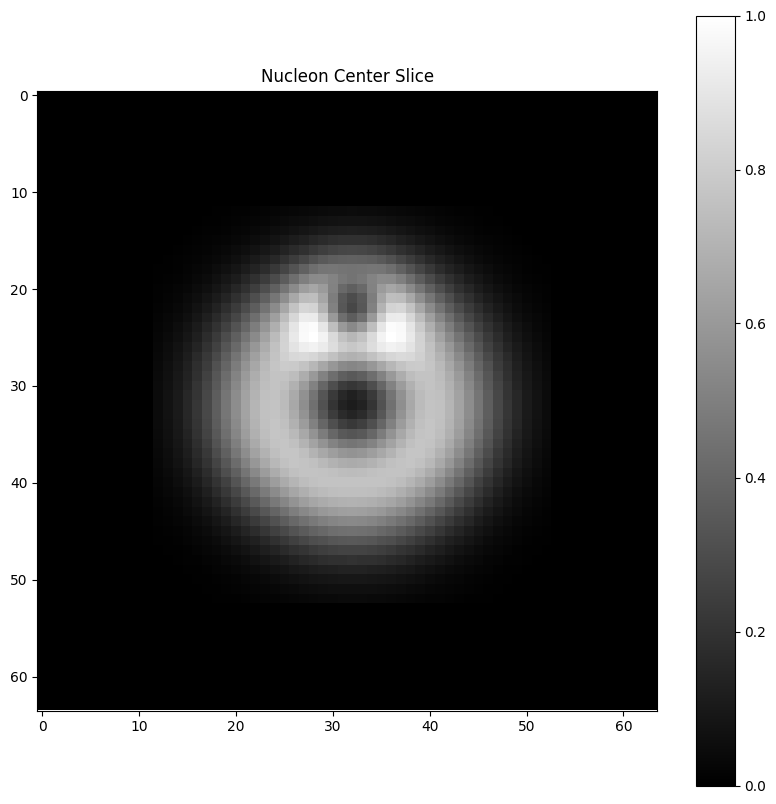

In [25]:
plt.figure(figsize=(10, 10))
plt.imshow(rotated_data, cmap='gray')
plt.title("Nucleon Center Slice")
plt.colorbar()
plt.show()

##### Data Driven

In [26]:
path = dd.get_image_traversal_path(rotated_data, 0.1, 4)

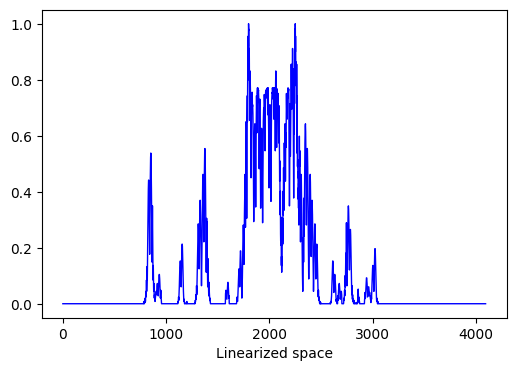

In [27]:
plot_intensity_traversal_path(path, rotated_data)

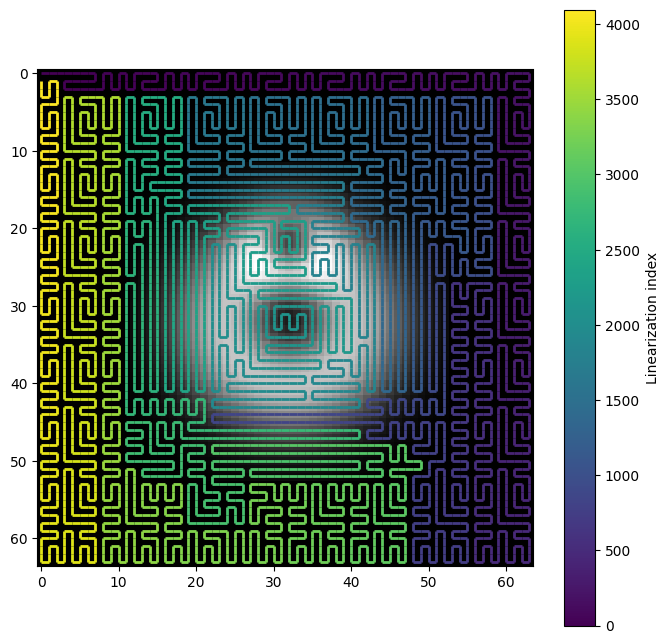

In [28]:
plot_traversal_path(path, rotated_data)

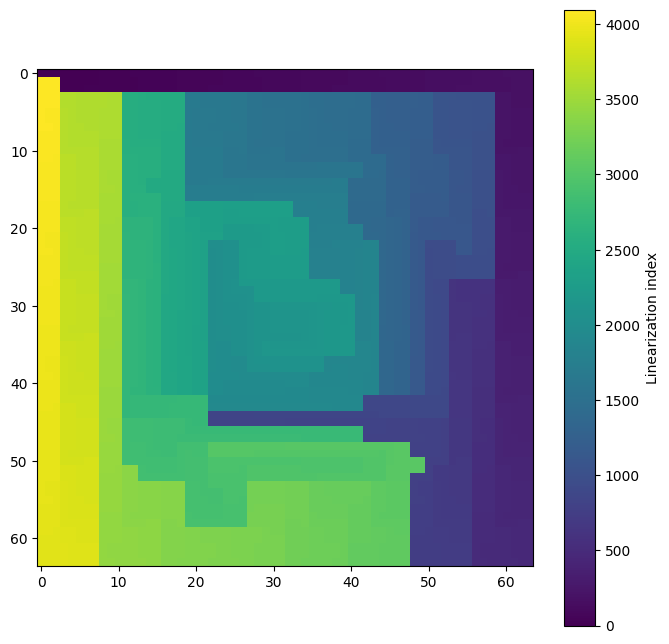

In [29]:
plot_colormap_traversal_path(path, rotated_data)

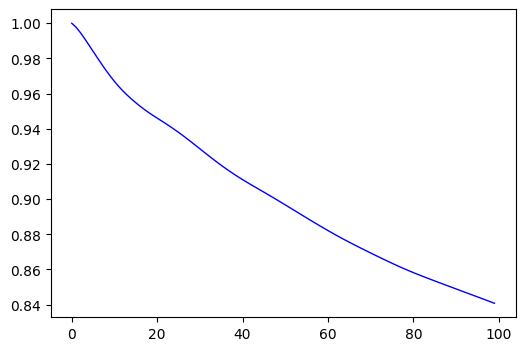

In [30]:
plot_data_autocorrelation(path, rotated_data)

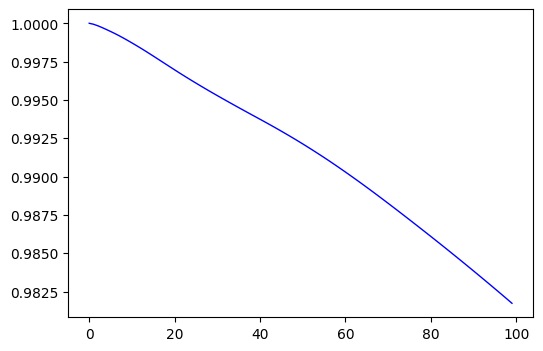

In [31]:
plot_radial_autocorrelation(path)

##### Context-Base

One can get the context-base original implementation by setting the alpha parameter to zero, completly ignoring the distance factor

In [32]:
path = dd.get_image_traversal_path(rotated_data, 0, 1)

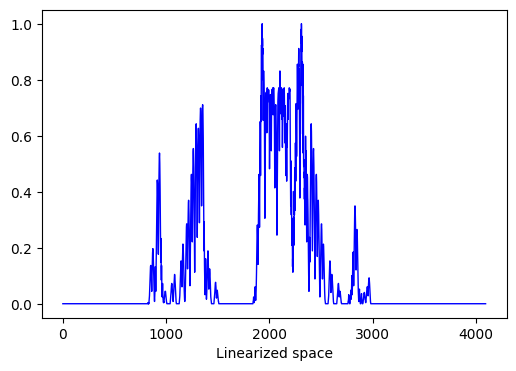

In [33]:
plot_intensity_traversal_path(path, rotated_data)

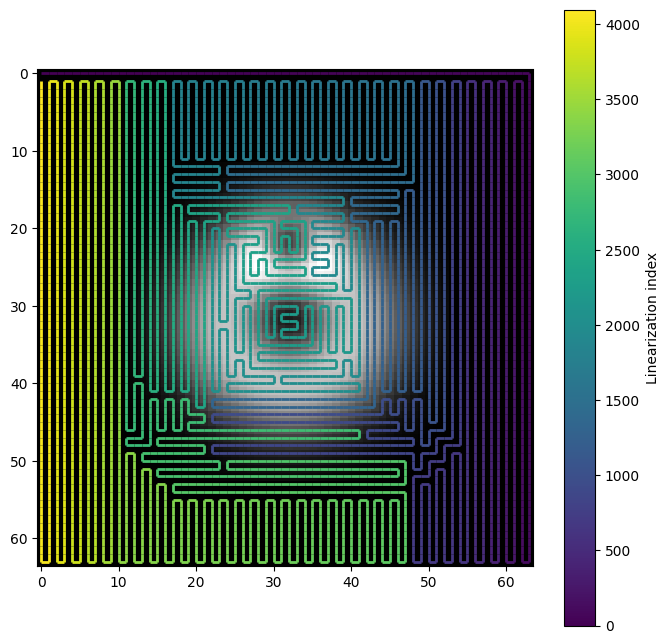

In [34]:
plot_traversal_path(path, rotated_data)

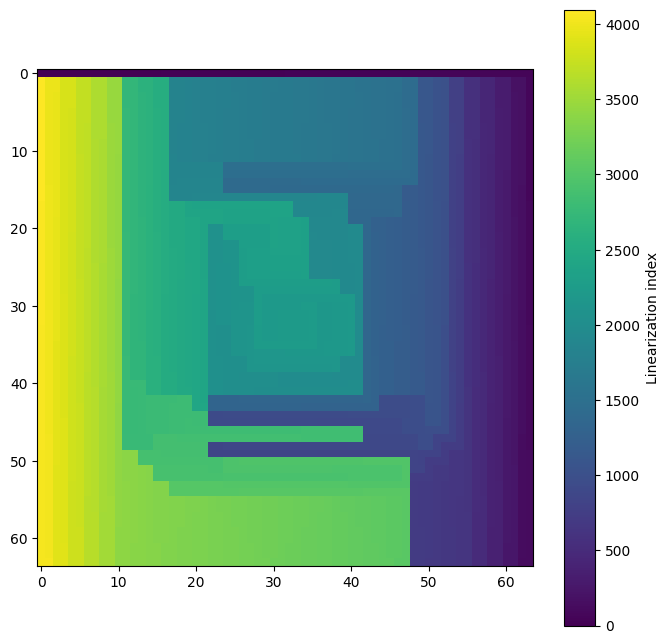

In [35]:
plot_colormap_traversal_path(path, rotated_data)

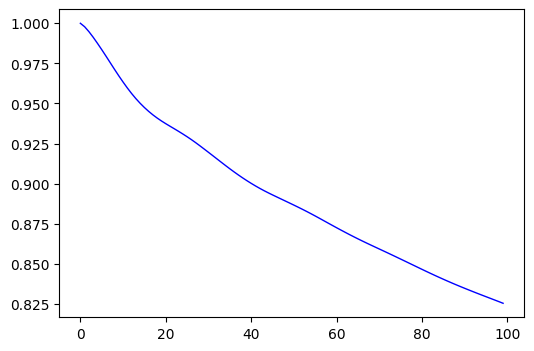

In [36]:
plot_data_autocorrelation(path, rotated_data)

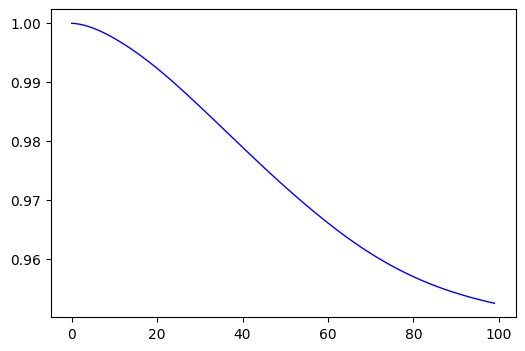

In [37]:
plot_radial_autocorrelation(path)

##### Scanline

In [38]:
scanline_path = get_scanline_path(rotated_data)

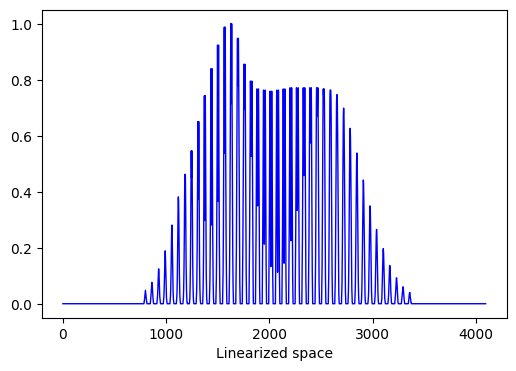

In [39]:
plot_intensity_traversal_path(scanline_path, rotated_data)

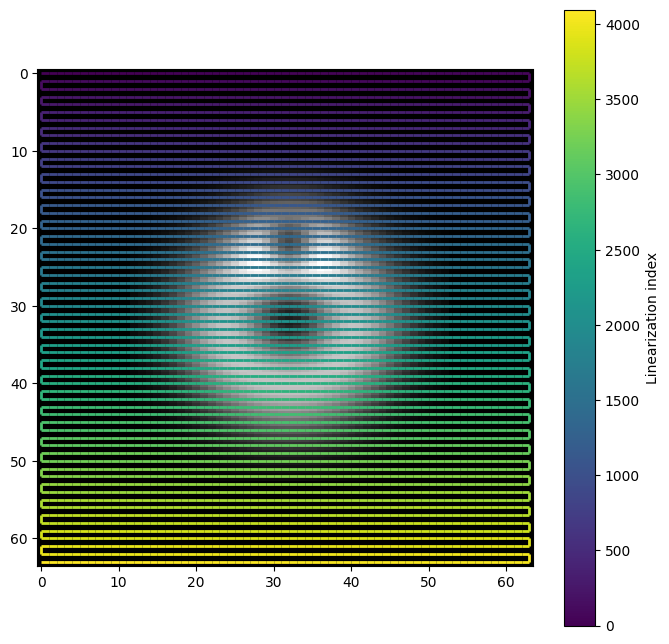

In [40]:
plot_traversal_path(scanline_path, rotated_data)

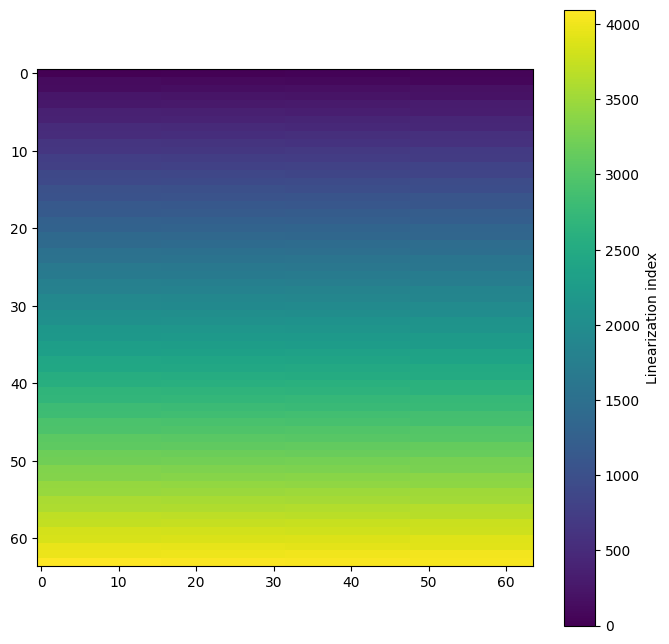

In [41]:
plot_colormap_traversal_path(scanline_path, rotated_data)

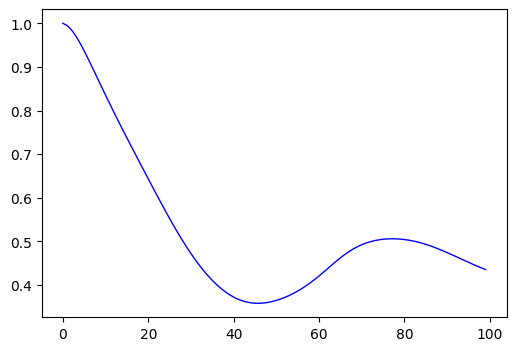

In [42]:
plot_data_autocorrelation(scanline_path, rotated_data)

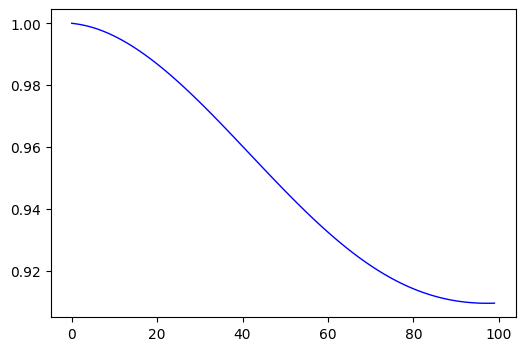

In [43]:
plot_radial_autocorrelation(scanline_path)

##### Hilbert

In [44]:
hilbert_path = get_hilbert_path(rotated_data)

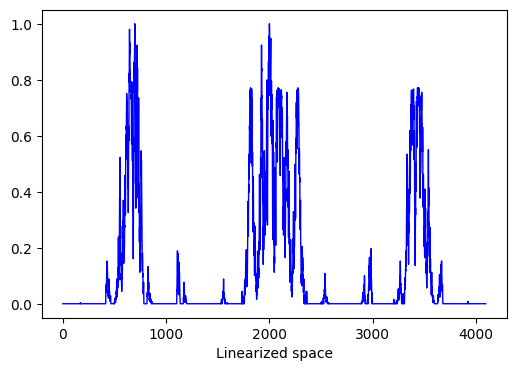

In [45]:
plot_intensity_traversal_path(hilbert_path, rotated_data)

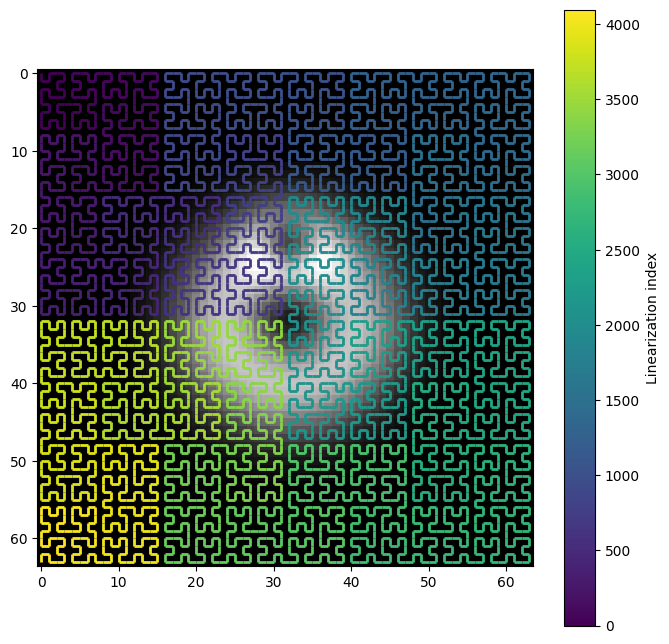

In [46]:
plot_traversal_path(hilbert_path, rotated_data)

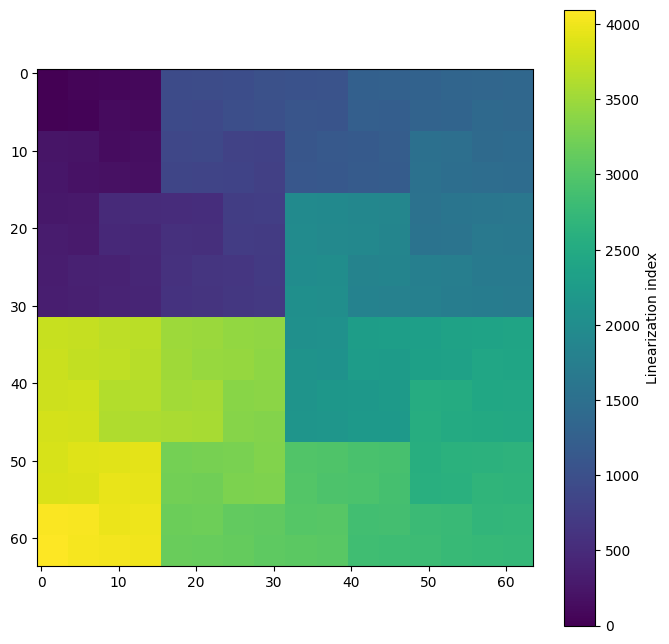

In [47]:
plot_colormap_traversal_path(hilbert_path, rotated_data)

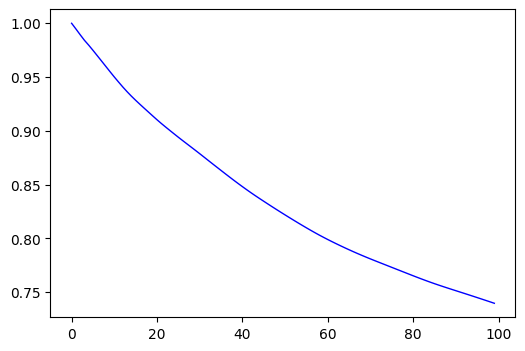

In [48]:
plot_data_autocorrelation(hilbert_path, rotated_data)

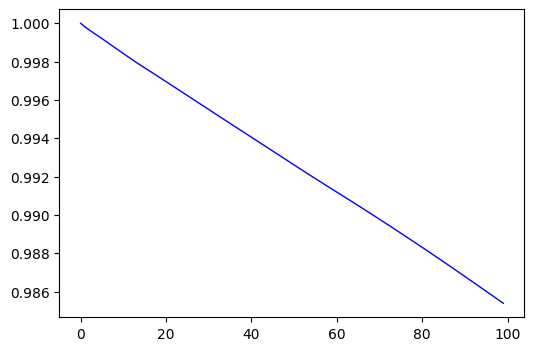

In [49]:
plot_radial_autocorrelation(hilbert_path)

### Feature tracking

In the work of _Temporal Merge Tree Maps: A Topology-Based Static Visualization for Temporal Scalar Data_, the linearization method is tested in different distribution functions. In here, the same tests available are used for comparison

##### Gaussian

In [50]:
filename = "images/oneDExample_gaussian.raw"
width, height = 128, 128
raw_data = np.fromfile(filename, dtype=np.float32)
image_gaussian = raw_data.reshape((height, width))
image_gaussian = normalize_data(image_gaussian)

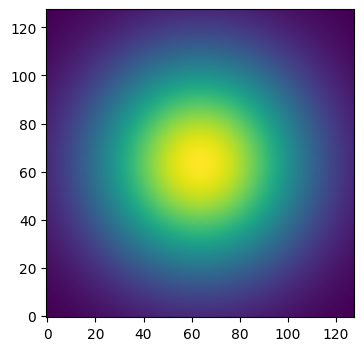

In [51]:
plt.figure(figsize=(4, 4))
plt.imshow(image_gaussian, cmap='viridis', origin='lower') 

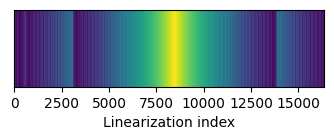

In [52]:
path_gaussian = dd.get_image_traversal_path(image_gaussian, 0, 1)
plot_linearize_image(path_gaussian, image_gaussian)

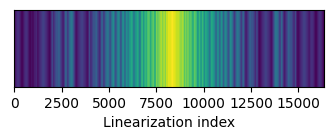

In [53]:
path_gaussian = dd.get_image_traversal_path(image_gaussian, 0.1, 4)
plot_linearize_image(path_gaussian, image_gaussian)

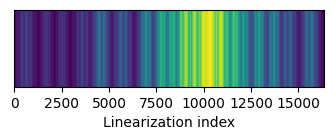

In [54]:
path_gaussian = dd.get_image_traversal_path(image_gaussian, 0.1, 11)
plot_linearize_image(path_gaussian, image_gaussian)

##### Delta sequence

In [55]:
filename = "images/oneDExample_delta.raw"
width, height = 128, 128
raw_data = np.fromfile(filename, dtype=np.float32)
image_delta = raw_data.reshape((height, width))
image_delta = normalize_data(image_delta)

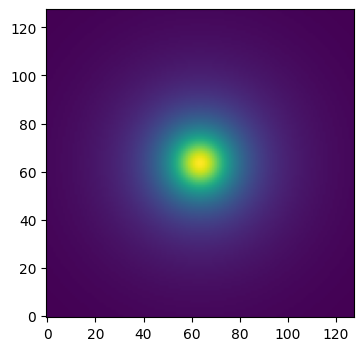

In [56]:
plt.figure(figsize=(4, 4))
plt.imshow(image_delta, cmap='viridis', origin='lower') 

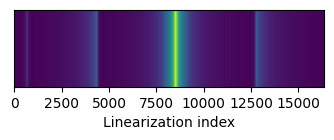

In [57]:
path_delta = dd.get_image_traversal_path(image_delta, 0, 1)
plot_linearize_image(path_delta, image_delta)

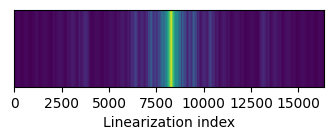

In [58]:
path_delta = dd.get_image_traversal_path(image_delta, 0.1, 4)
plot_linearize_image(path_delta, image_delta)

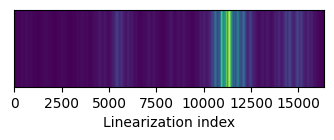

In [59]:
path_delta = dd.get_image_traversal_path(image_delta, 0.1, 11)
plot_linearize_image(path_delta, image_delta)

##### Multiple features

In [60]:
filename = "images/oneDExample_prototype.raw"
width, height = 128, 128
raw_data = np.fromfile(filename, dtype=np.float32)
image_multiple = raw_data.reshape((height, width))
image_multiple = normalize_data(image_multiple)

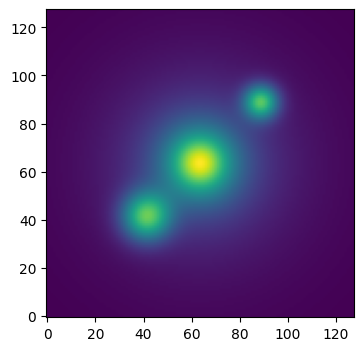

In [61]:
plt.figure(figsize=(4, 4))
plt.imshow(image_multiple, cmap='viridis', origin='lower') 

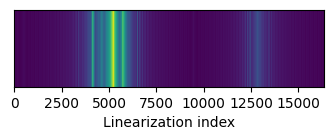

In [62]:
path_multiple = dd.get_image_traversal_path(image_multiple, 0, 1)
plot_linearize_image(path_multiple, image_multiple)

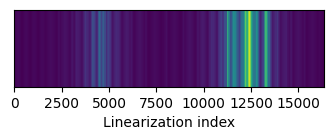

In [63]:
path_multiple = dd.get_image_traversal_path(image_multiple, 0.1, 4)
plot_linearize_image(path_multiple, image_multiple)

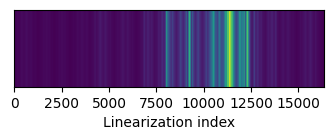

In [64]:
path_multiple = dd.get_image_traversal_path(image_multiple, 0.1, 11)
plot_linearize_image(path_multiple, image_multiple)

##### Skewed Gaussian

In [65]:
filename = "images/oneDExample_skewedGaussian.raw"
width, height = 128, 128
raw_data = np.fromfile(filename, dtype=np.float32)
image = raw_data.reshape((height, width))
image = normalize_data(image)

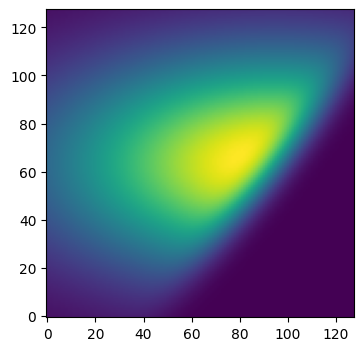

In [66]:
plt.figure(figsize=(4, 4))
plt.imshow(image, cmap='viridis', origin='lower') 

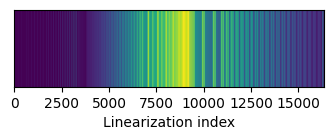

In [67]:
path = dd.get_image_traversal_path(image, 0, 1)
plot_linearize_image(path, image)

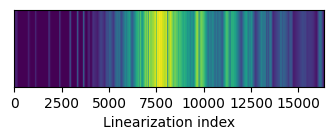

In [68]:
path = dd.get_image_traversal_path(image, 0.1, 4)
plot_linearize_image(path, image)

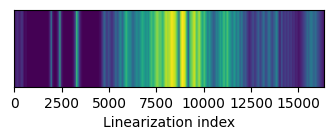

In [69]:
path = dd.get_image_traversal_path(image, 0.1, 11)
plot_linearize_image(path, image)

## Animations

### Common functions

In [70]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML



In [71]:
def linearize_animation(paths, src_frames):
  arr = np.array(paths)
  xs = arr[:, :, 0]
  ys = arr[:, :, 1]
  frame_id = np.arange(len(paths))[:,None]
  return src_frames[frame_id,xs, ys]


In [72]:
def plot_linearize_animation(paths, src_frames, cmap='viridis'):
  linear_frames = linearize_animation(paths, src_frames).T
  _, ax = plt.subplots(figsize=(8, 4))
  ax.set_yticks([])
  ax.set_xticks([])
  ax.set_xlabel('Time')
  ax.set_ylabel('Linearized space')
  ax.imshow(linear_frames, cmap=cmap, origin='lower', aspect='auto') 
  plt.show()

  

### L2-norm original implementation

Initially it was done in Python to test feasibility before being exported to the C++ library

In [73]:
def get_pixel_values_from_path(image, path):
  """
  Extracts the sequence of pixel values from the image following the path.
  Args:
      image: Numpy array of shape (H, W, C) or (H, W)
      path: List of (row, col) tuples or Numpy array of shape (N, 2)
  Returns:
      Numpy array of shape (N, C) or (N, 1) containing pixel values.
  """
  values = linearize_image(path, image)
  
  # Ensure it is at least 2D (N, 1) for consistent logic below
  if values.ndim == 1:
    values = values[:, np.newaxis]
      
  return values

In [74]:
def find_best_rotation_fft(current_path, previous_path):
  """
  Finds the optimal rotation of 'current_path' to match 'previous_path'.
  Uses FFT-based correlation (O(N log N)).
  """
  # Cyclic Correlation
  current_path = np.concatenate((current_path, current_path[:-1]), axis=0)
  
  total_correlation = None
  
  # Process each color channel independently and sum the scores
  # Squared Euclidean Distance is additive across dimensions
  num_channels = current_path.shape[1]
  
  for c in range(num_channels):
    sig_a = current_path[:, c]
    sig_b = previous_path[:, c]
    
    # mode ='valid' : returns only the parts where the signals fully overlap
    corr = signal.correlate(sig_a, sig_b, mode='valid', method='fft')
    
    if total_correlation is None:
      total_correlation = corr
    else:
      total_correlation += corr
          
  # Best rotation is at the maximum index
  best_shift = np.argmax(total_correlation)
  max_score = total_correlation[best_shift]
  
  return best_shift, max_score

In [75]:
def reorder_frames_python(all_images, all_paths):
  """
  Do the alignment of a sequence of space-filling curves with L2-norm.
  """
  num_frames = len(all_paths)

  for i in range(1, num_frames):
    # Extract pixel sequences
    previous_path = get_pixel_values_from_path(all_images[i-1], all_paths[i-1])
    current_path = get_pixel_values_from_path(all_images[i], all_paths[i])
    
    # Normal Orientation
    shift_norm, score_norm = find_best_rotation_fft(current_path, previous_path)
    
    # Reversed Orientation
    current_path_rev = current_path[::-1]
    shift_rev, score_rev = find_best_rotation_fft(current_path_rev, previous_path)
    
    # Choose best of the two rotations
    current_path = all_paths[i]
    
    if score_rev > score_norm:
      current_path.reverse()
      all_paths[i] = current_path[shift_rev:] + current_path[:shift_rev]
    else:
      all_paths[i] = current_path[shift_norm:] + current_path[:shift_norm]
        
  return all_paths

### Gaussian: single feature

In [76]:
filename = "animations/moving_normal_distribution.raw"
total_frames, width, height = 60, 128, 128
raw_data = np.fromfile(filename, dtype=np.float32)
moving_normal_distribution = raw_data.reshape((total_frames, height, width))
moving_normal_distribution = normalize_data(moving_normal_distribution)

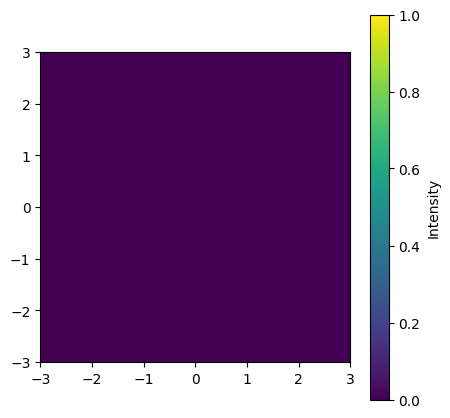

In [77]:
fig, ax = plt.subplots(figsize=(5, 5))

im = ax.imshow(moving_normal_distribution[0], extent=(-3, +3, -3, +3), origin='lower', cmap='viridis', vmin=0, vmax=1)

plt.colorbar(im, label="Intensity")

def update(frame_idx):
  im.set_data(moving_normal_distribution[frame_idx])
  return [im]

anim = FuncAnimation(fig, update, frames=total_frames, interval=50, blit=True)
HTML(anim.to_jshtml())

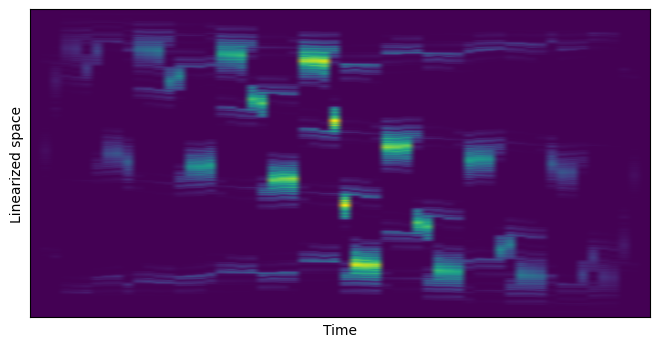

In [78]:
paths = dd.get_multiple_images_traversal_path(moving_normal_distribution, 0.1, 4)
plot_linearize_animation(paths, moving_normal_distribution)

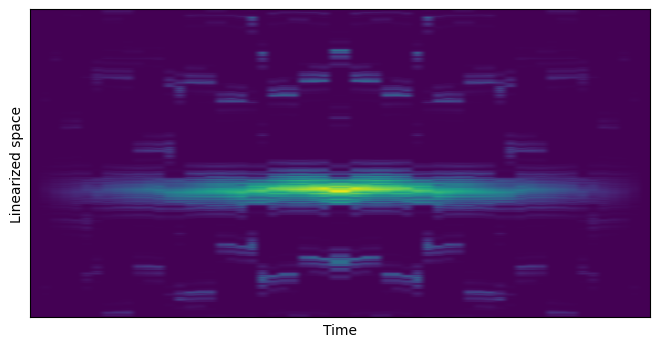

In [79]:
paths = dd.get_multiple_images_traversal_path(moving_normal_distribution, 0.1, 4, "L1-norm")
plot_linearize_animation(paths, moving_normal_distribution)

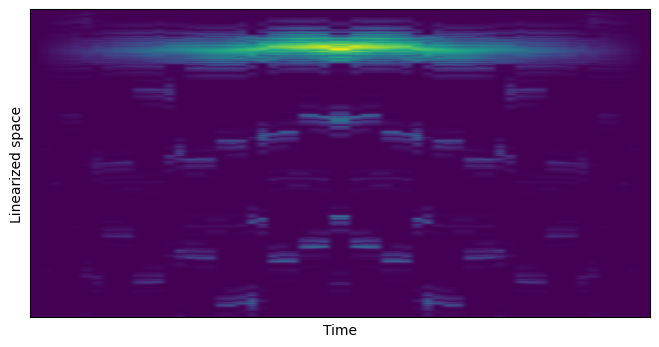

In [80]:
paths = dd.get_multiple_images_traversal_path(moving_normal_distribution, 0.1, 4, "L2-norm")
plot_linearize_animation(paths, moving_normal_distribution)

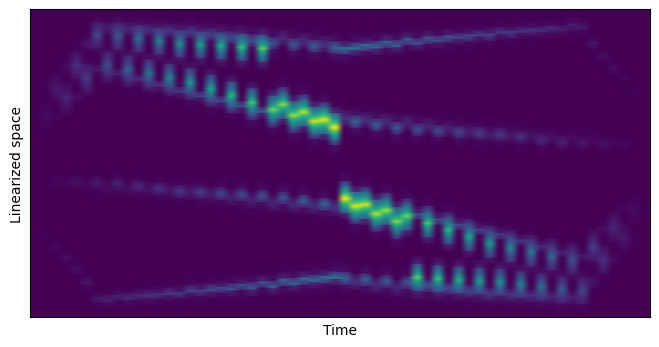

In [81]:
paths = dd.get_multiple_images_traversal_path(moving_normal_distribution, 0.0, 1)
plot_linearize_animation(paths, moving_normal_distribution)

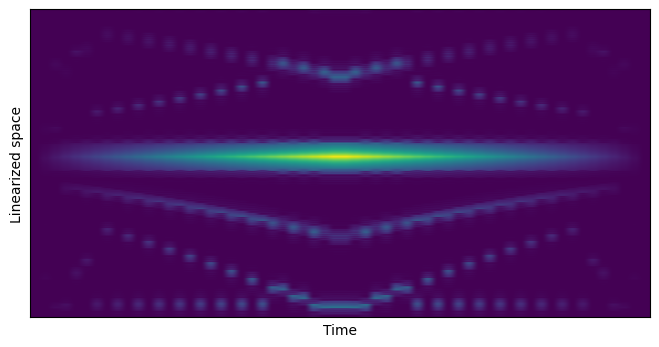

In [82]:
paths = dd.get_multiple_images_traversal_path(moving_normal_distribution, 0.0, 1, "L1-norm")
plot_linearize_animation(paths, moving_normal_distribution)

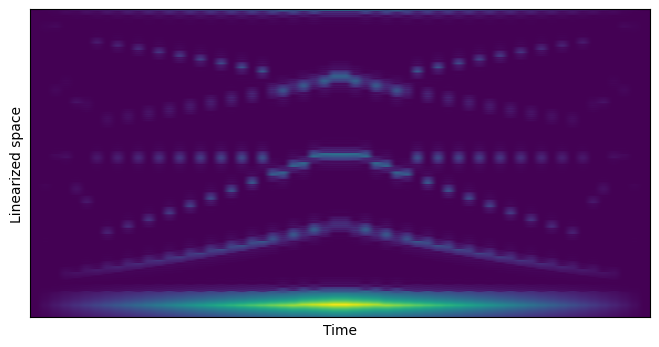

In [83]:
paths = dd.get_multiple_images_traversal_path(moving_normal_distribution, 0.0, 1, "L2-norm")
plot_linearize_animation(paths, moving_normal_distribution)

### Gaussian: two features

In [84]:
filename = "animations/two_features_moving_normal_distribution.raw"
total_frames, width, height = 60, 128, 128
raw_data = np.fromfile(filename, dtype=np.float32)
moving_normal_distribution_two_features = raw_data.reshape((total_frames, height, width))
moving_normal_distribution_two_features = normalize_data(moving_normal_distribution_two_features)

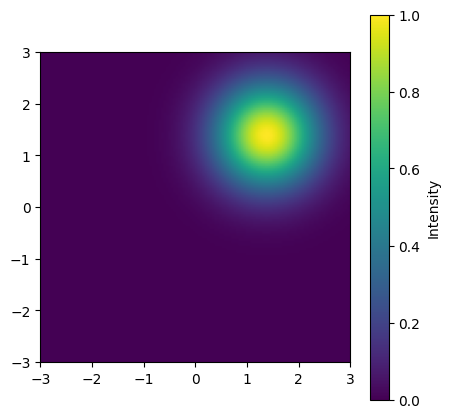

In [85]:
fig, ax = plt.subplots(figsize=(5, 5))

im = ax.imshow(moving_normal_distribution_two_features[0], extent=(-3, +3, -3, +3), origin='lower', cmap='viridis', vmin=0, vmax=1)

plt.colorbar(im, label="Intensity")

def update(frame_idx):
  im.set_data(moving_normal_distribution_two_features[frame_idx])
  return [im]

anim = FuncAnimation(fig, update, frames=total_frames, interval=50, blit=True)
HTML(anim.to_jshtml())

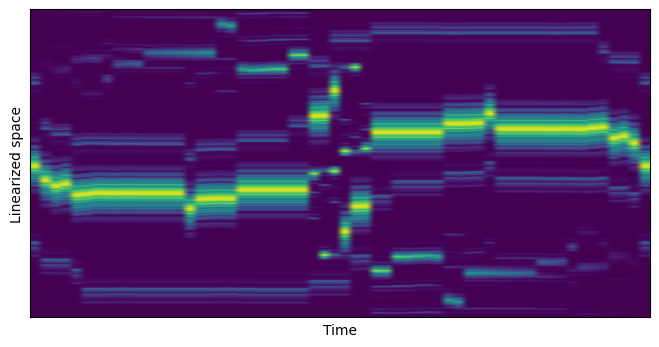

In [86]:
paths = dd.get_multiple_images_traversal_path(moving_normal_distribution_two_features, 0.1, 4)
plot_linearize_animation(paths, moving_normal_distribution_two_features)

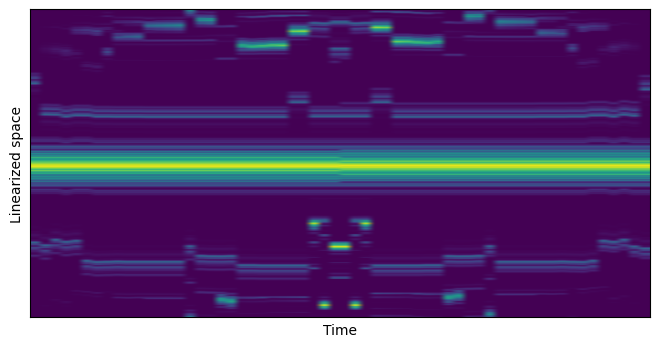

In [87]:
paths = dd.get_multiple_images_traversal_path(moving_normal_distribution_two_features, 0.1, 4, "L1-norm")
plot_linearize_animation(paths, moving_normal_distribution_two_features)

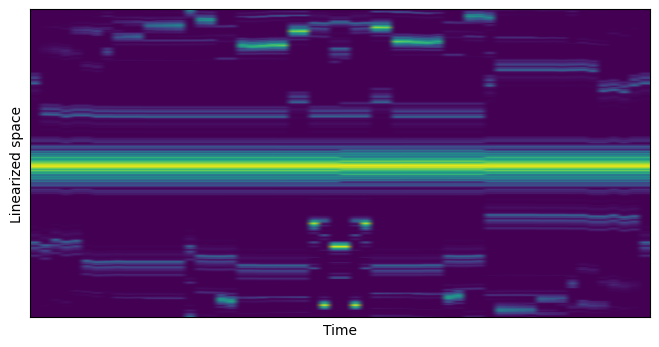

In [88]:
paths = dd.get_multiple_images_traversal_path(moving_normal_distribution_two_features, 0.1, 4, "L2-norm")
plot_linearize_animation(paths, moving_normal_distribution_two_features)

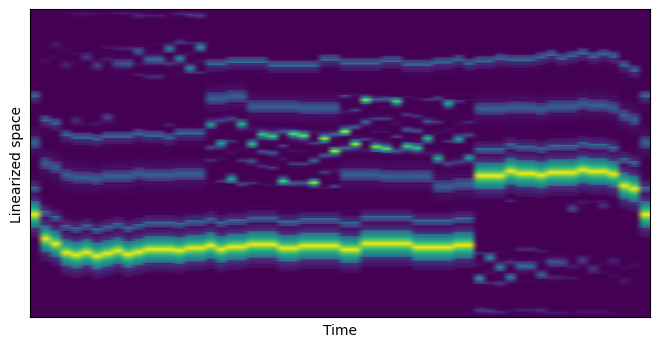

In [89]:
paths = dd.get_multiple_images_traversal_path(moving_normal_distribution_two_features, 0.0, 1)
plot_linearize_animation(paths, moving_normal_distribution_two_features)

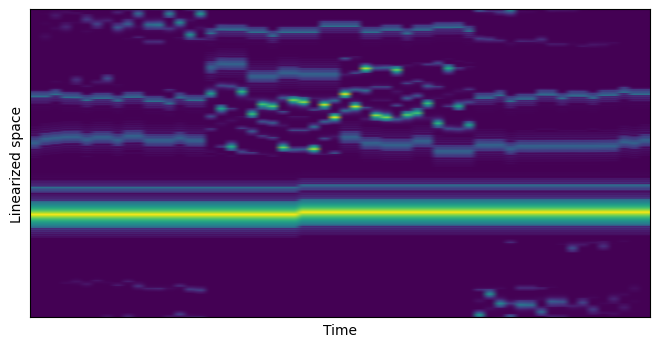

In [90]:
paths = dd.get_multiple_images_traversal_path(moving_normal_distribution_two_features, 0.0, 1, "L1-norm")
plot_linearize_animation(paths, moving_normal_distribution_two_features)

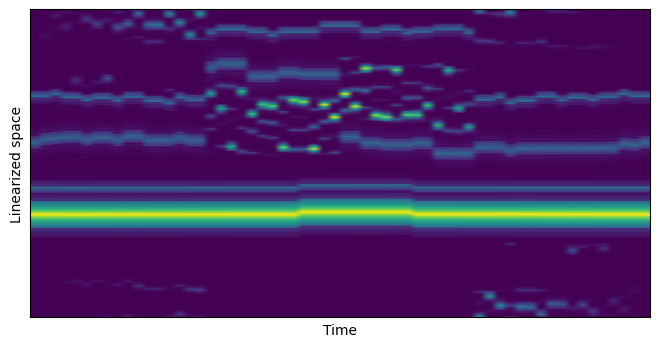

In [91]:
paths = dd.get_multiple_images_traversal_path(moving_normal_distribution_two_features, 0.0, 1, "L2-norm")
plot_linearize_animation(paths, moving_normal_distribution_two_features)

### Expanding ring

In [77]:
filename = "animations/expanding_ring.raw"
total_frames, width, height = 60, 128, 128
raw_data = np.fromfile(filename, dtype=np.float32)
expanding_ring = raw_data.reshape((total_frames, height, width))
expanding_ring = normalize_data(expanding_ring)

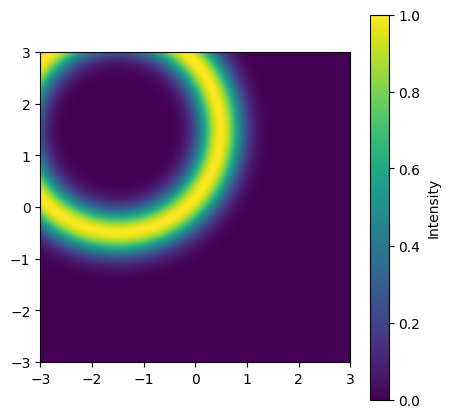

In [78]:
fig, ax = plt.subplots(figsize=(5, 5))

im = ax.imshow(expanding_ring[0], extent=(-3, +3, -3, +3), origin='lower', cmap='viridis', vmin=0, vmax=1)

plt.colorbar(im, label="Intensity")

def update(frame_idx):
  im.set_data(expanding_ring[frame_idx])
  return [im]

anim = FuncAnimation(fig, update, frames=total_frames, interval=50, blit=True)
HTML(anim.to_jshtml())

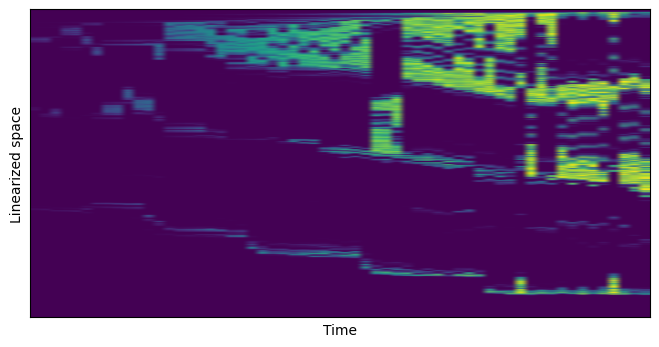

In [79]:
paths = dd.get_multiple_images_traversal_path(expanding_ring, 0.1, 4)
plot_linearize_animation(paths, expanding_ring, 'viridis')

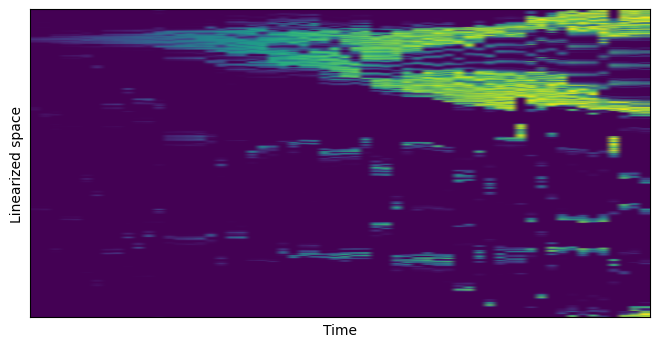

In [80]:
paths = dd.get_multiple_images_traversal_path(expanding_ring, 0.1, 4, "L1-norm")
plot_linearize_animation(paths, expanding_ring, 'viridis')

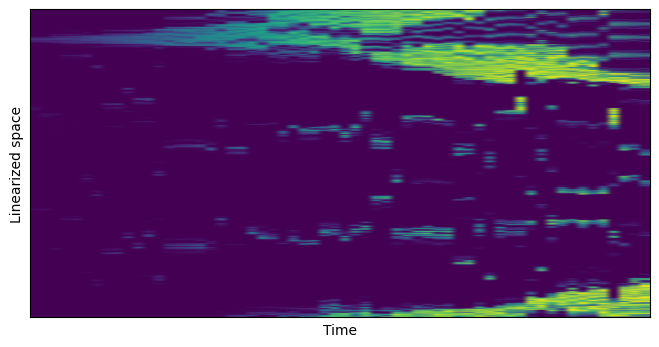

In [81]:
paths = dd.get_multiple_images_traversal_path(expanding_ring, 0.1, 4, "L2-norm")
plot_linearize_animation(paths, expanding_ring, 'viridis')

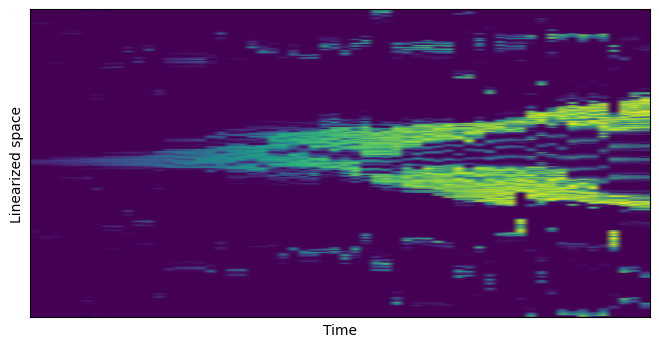

In [82]:
### rotate result for better visualization
rot = -6500
rotated_paths = [path[-rot:] + path[:-rot] for path in paths]
plot_linearize_animation(rotated_paths, expanding_ring, 'viridis')

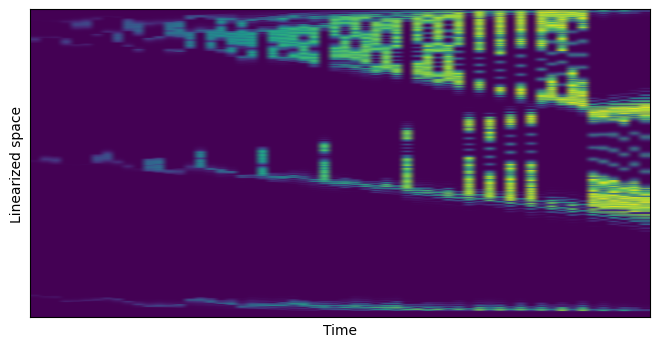

In [83]:
paths = dd.get_multiple_images_traversal_path(expanding_ring, 0.0, 1)
plot_linearize_animation(paths, expanding_ring, 'viridis')

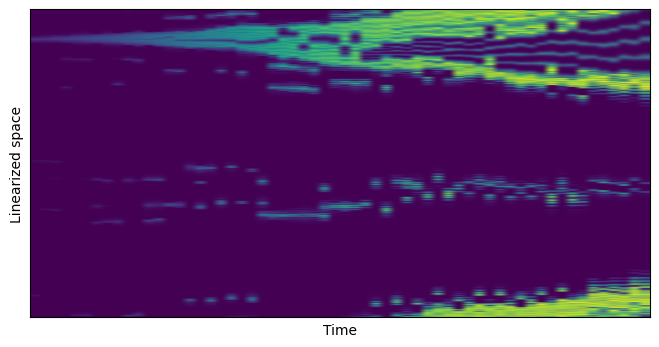

In [84]:
paths = dd.get_multiple_images_traversal_path(expanding_ring, 0.0, 1, "L1-norm")
plot_linearize_animation(paths, expanding_ring, 'viridis')

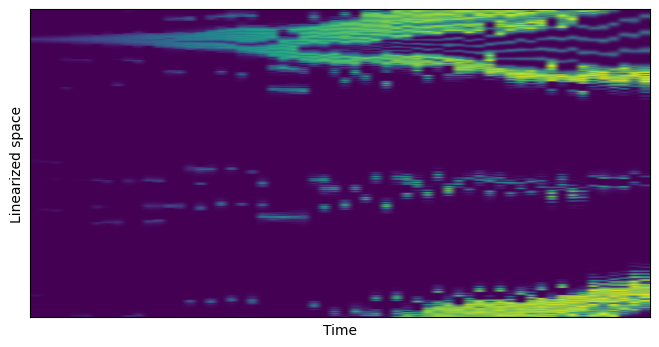

In [85]:
paths = dd.get_multiple_images_traversal_path(expanding_ring, 0.0, 1, "L2-norm")
plot_linearize_animation(paths, expanding_ring, 'viridis')

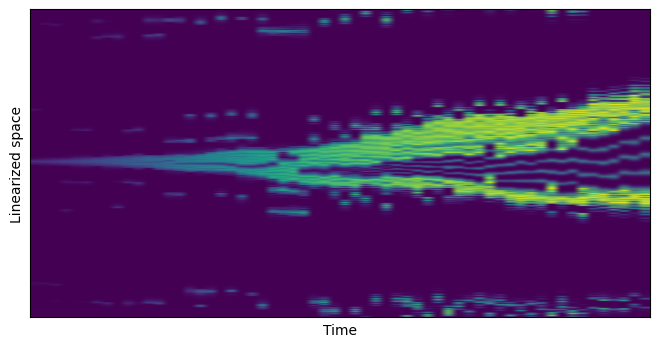

In [86]:
### rotate result for better visualization
rot = -6500
rotated_paths = [path[-rot:] + path[:-rot] for path in paths]
plot_linearize_animation(rotated_paths, expanding_ring, 'viridis')

## Metrics comparison

### Loading more datasets

In [93]:
x, y, z = 256, 256, 256

data_1d = np.fromfile("images/bonsai_256x256x256_uint8.raw", dtype=np.uint8)
bonsai_dataset = data_1d.reshape((z, y, x))

bonsai_dataset = normalize_data(bonsai_dataset)

In [94]:
x, y, z = 256, 256, 128

data_1d = np.fromfile("images/engine_256x256x128_uint8.raw", dtype=np.uint8)
engine_dataset = data_1d.reshape((z, y, x))

engine_dataset = normalize_data(engine_dataset)

In [104]:
x, y, z = 256, 256, 124

data_1d = np.fromfile("images/mri_ventricles_256x256x124_uint8.raw", dtype=np.uint8)
mri_dataset = data_1d.reshape((z, y, x))

mri_dataset = normalize_data(mri_dataset)

In [105]:
x, y, z = 256, 256, 44

data_1d = np.fromfile("images/frog_256x256x44_uint8.raw", dtype=np.uint8)
frog_dataset = data_1d.reshape((z, y, x))

frog_dataset = normalize_data(frog_dataset)

In [106]:
x, y, z = 256, 256, 512

data_1d = np.fromfile("images/carp_256x256x512_uint16.raw", dtype=np.uint16)
carp_dataset = data_1d.reshape((z, y, x))

carp_dataset = normalize_data(carp_dataset)

### Datasets preprocess

In [107]:
SLICES = 10

In [108]:
def slice_dataset(volume_dataset, SLICES):
  H = volume_dataset.shape[0]
  lp = np.linspace(0.20 * H, 0.80 * H, SLICES, dtype=int)
  return volume_dataset[lp, :, :,]

In [109]:
volumes = [
  slice_dataset(nucleon_dataset, SLICES),
  slice_dataset(moving_normal_distribution, SLICES),
  slice_dataset(moving_normal_distribution_two_features, SLICES),
  slice_dataset(expanding_ring, SLICES),
  slice_dataset(bonsai_dataset, SLICES),
  slice_dataset(engine_dataset, SLICES),
  slice_dataset(mri_dataset, SLICES),
  slice_dataset(frog_dataset, SLICES),
  slice_dataset(carp_dataset, SLICES),
]

#### Slices visualization

Visualing the metrics used for autocorrelation metrics

In [110]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import os

OUTPUT_DIR = os.path.join("animations", "metrics_preview")
os.makedirs(OUTPUT_DIR, exist_ok=True)

def animate_and_save(volume, filename, title="Volume Animation", cmap='viridis', interval=100):
  fig, ax = plt.subplots(figsize=(5, 5))
  
  # 3. Plot the first frame
  # We remove 'extent' here so it works for any generic pixel dimensions
  im = ax.imshow(volume[0], origin='lower', cmap=cmap, vmin=0.0, vmax=1.0)
  
  plt.colorbar(im, label="Intensity")
  ax.set_title(f"{title} (Slice 0)")
  ax.set_yticks([])
  ax.set_xticks([])

  # 4. Update Function
  def update(frame_idx):
    im.set_data(volume[frame_idx])
    ax.set_title(f"{title} (Slice {frame_idx})")
    return [im]


  anim = FuncAnimation(fig, update, frames=len(volume), interval=interval, blit=True)
  
  save_path = os.path.join(OUTPUT_DIR, f"{filename}.gif")
  print(f"Saving to {save_path}")
  anim.save(save_path, writer='pillow', fps=10)
  
  plt.close(fig)

In [111]:
dataset_names = [
  "nucleon", 
  "moving_normal", 
  "moving_normal_two_features", 
  "expanding_ring",
  "bonsai",
  "engine",
  "mri",
  "frog",
  "carp",
]

for i, vol in enumerate(volumes):
  name = dataset_names[i]
  colormap = 'YlOrBr' if "ring" in name else 'viridis'
  
  animate_and_save(vol, name, title=name, cmap=colormap)

Saving to animations/metrics_preview/nucleon.gif
Saving to animations/metrics_preview/moving_normal.gif
Saving to animations/metrics_preview/moving_normal_two_features.gif
Saving to animations/metrics_preview/expanding_ring.gif
Saving to animations/metrics_preview/bonsai.gif
Saving to animations/metrics_preview/engine.gif
Saving to animations/metrics_preview/mri.gif
Saving to animations/metrics_preview/frog.gif
Saving to animations/metrics_preview/carp.gif


![Nucleon](animations/metrics_preview/bonsai.gif) \
![Normal](animations/metrics_preview/carp.gif) \
![Normal2](animations/metrics_preview/engine.gif) \
![Ring](animations/metrics_preview/expanding_ring.gif) \
![Nucleon](animations/metrics_preview/frog.gif) \
![Normal2](animations/metrics_preview/moving_normal_two_features.gif) \
![Normal](animations/metrics_preview/moving_normal.gif) \
![Normal2](animations/metrics_preview/mri.gif) \
![Ring](animations/metrics_preview/nucleon.gif)

### Autocorrelation

In [112]:
BLOCK_SIZE = 4
ALPHA = 0.1
LAGS = 200

In [113]:
dictionary = dict(
  alphas = [0.0, 0.001, 0.01, 0.1, 0.3, 0.5, 0.7, 1.0],
  colors = [],
  avg_data_autocorr = [],
  avg_radial_autocorr = [],
)

In [114]:
# Generate colors
dictionary['colors'] = []

cmap = plt.get_cmap('viridis')
norm_indices = np.linspace(0, 1, len(dictionary['alphas']))

for i in norm_indices:
  dictionary['colors'].append(cmap(i))

In [115]:
def calculate_method_average(path_func, autocorrelation_func, volumes, lags):
  acc = np.zeros(lags)
  total_slices = 0

  for dataset_slices in volumes:
    for img_slice in dataset_slices:
      path = path_func(img_slice)
      acc += autocorrelation_func(path, img_slice)
      total_slices += 1

  return acc / total_slices


In [116]:
# Generate autocorrelations
dictionary['avg_data_autocorr'] = []
for i, alpha in enumerate(dictionary['alphas']):
  u_acc = np.zeros(LAGS) 
  
  print(f"Processing Alpha: {alpha}")
  u_avg = calculate_method_average(
    lambda img: dd.get_image_traversal_path(img, alpha, BLOCK_SIZE),
    lambda path, img: calculate_data_autocorrelation(path, img, LAGS),
    volumes,
    LAGS
  )
  dictionary['avg_data_autocorr'].append(u_avg)


Processing Alpha: 0.0
Processing Alpha: 0.001
Processing Alpha: 0.01
Processing Alpha: 0.1
Processing Alpha: 0.3
Processing Alpha: 0.5
Processing Alpha: 0.7
Processing Alpha: 1.0


In [117]:
# Generate autocorrelations
dictionary['avg_radial_autocorr'] = []
for i, alpha in enumerate(dictionary['alphas']):
  print(f"Processing Alpha: {alpha}")
  t_avg = calculate_method_average(
    lambda img: dd.get_image_traversal_path(img, alpha, BLOCK_SIZE),
    lambda path, _: calculate_radial_autocorrelation(path, LAGS),
    volumes,
    LAGS
  )
  dictionary['avg_radial_autocorr'].append(t_avg)


Processing Alpha: 0.0
Processing Alpha: 0.001
Processing Alpha: 0.01
Processing Alpha: 0.1
Processing Alpha: 0.3
Processing Alpha: 0.5
Processing Alpha: 0.7
Processing Alpha: 1.0


[]

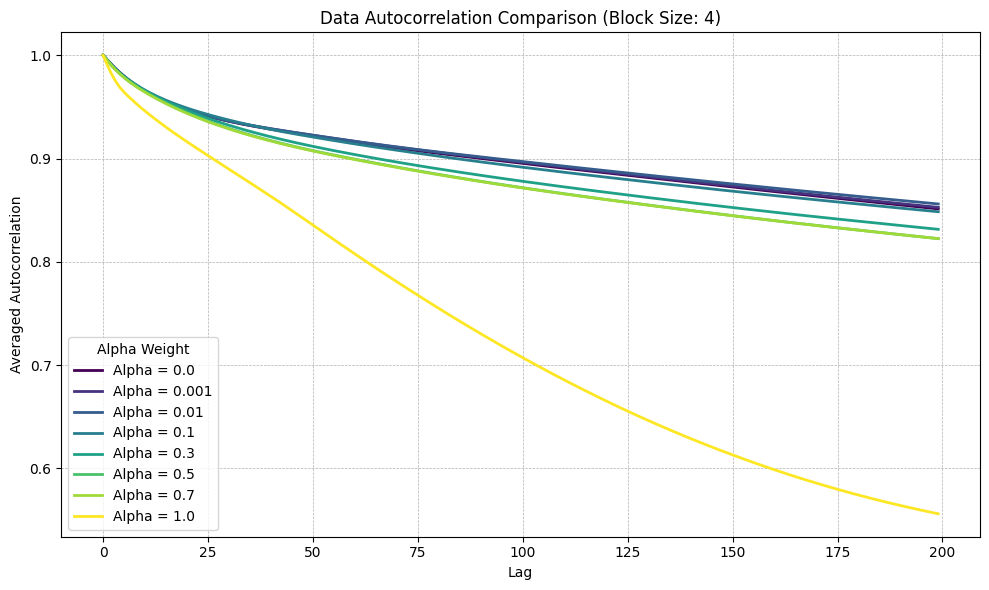

In [118]:
plt.figure(figsize=(10, 6), dpi=100)

# Data autocorrelation
for i, alpha in enumerate(dictionary['alphas']):
  u_avg = dictionary['avg_data_autocorr'][i]
  color = dictionary['colors'][i]

  plt.plot(range(LAGS), u_avg, linewidth=2, color=color, label=f'Alpha = {alpha}')

plt.title(f'Data Autocorrelation Comparison (Block Size: {BLOCK_SIZE})')
plt.xlabel('Lag')
plt.ylabel('Averaged Autocorrelation')
plt.legend(title="Alpha Weight")
plt.grid(True, which='major', linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.plot()

[]

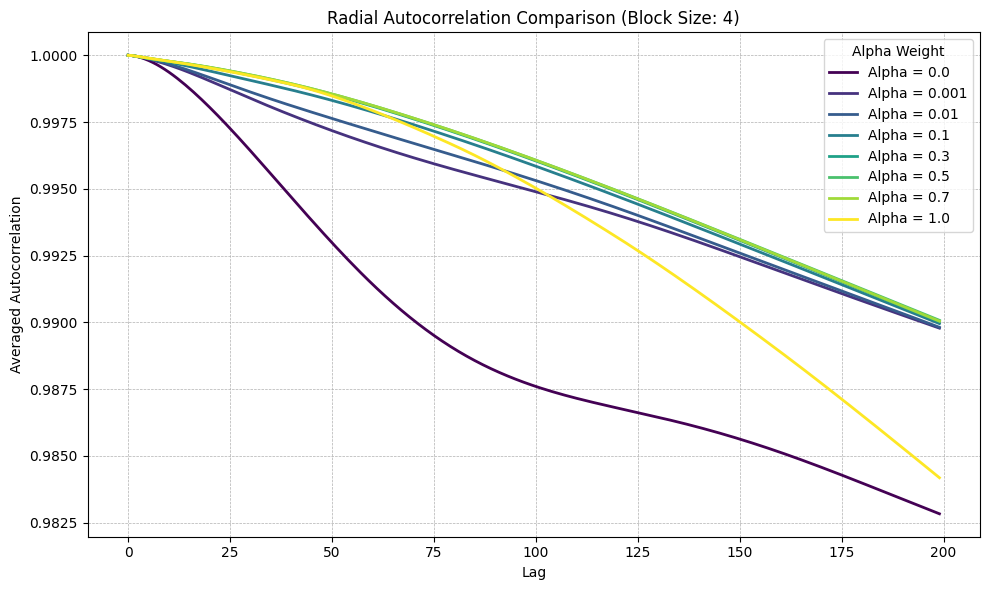

In [119]:
plt.figure(figsize=(10, 6), dpi=100)

# Data autocorrelation
for i, alpha in enumerate(dictionary['alphas']):
  u_avg = dictionary['avg_radial_autocorr'][i]
  color = dictionary['colors'][i]

  plt.plot(range(LAGS), u_avg, linewidth=2, color=color, label=f'Alpha = {alpha}')

plt.title(f'Radial Autocorrelation Comparison (Block Size: {BLOCK_SIZE})')
plt.xlabel('Lag')
plt.ylabel('Averaged Autocorrelation')
plt.legend(title="Alpha Weight")
plt.grid(True, which='major', linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.plot()

Processing Data-driven with a fixed alpha value: 0.1
Processing Hilbert
Processing Scanline


[]

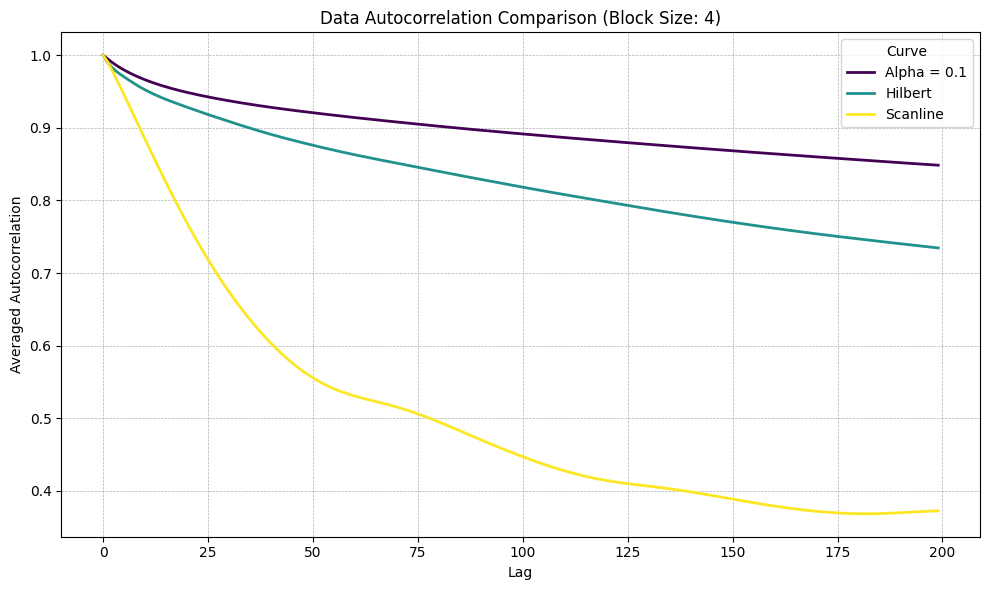

In [124]:
plt.figure(figsize=(10, 6), dpi=100)
cmap = plt.get_cmap('viridis')
id = np.linspace(0, 1, 3)

print(f"Processing Data-driven with a fixed alpha value: {ALPHA}")
u_dd = calculate_method_average(
  lambda img: dd.get_image_traversal_path(img, ALPHA, BLOCK_SIZE),
  lambda path, img: calculate_data_autocorrelation(path, img, LAGS),
  volumes,
  LAGS
)

print(f"Processing Hilbert")
# Hilbert
u_h = calculate_method_average(
  lambda img: get_hilbert_path(img),
  lambda path, img: calculate_data_autocorrelation(path, img, LAGS),
  volumes,
  LAGS
)

print(f"Processing Scanline")
# Scanline
u_sl = calculate_method_average(
  lambda img: get_scanline_path(img),
  lambda path, img: calculate_data_autocorrelation(path, img, LAGS),
  volumes,
  LAGS
)

plt.plot(range(LAGS), u_dd, linewidth=2, color=cmap(id[0]), label=f'Alpha = {ALPHA}')
plt.plot(range(LAGS), u_h, linewidth=2, color=cmap(id[1]), label='Hilbert')
plt.plot(range(LAGS), u_sl, linewidth=2, color=cmap(id[2]), label='Scanline')

plt.title(f'Data Autocorrelation Comparison (Block Size: {BLOCK_SIZE})')
plt.xlabel('Lag')
plt.ylabel('Averaged Autocorrelation')
plt.legend(title="Curve")
plt.grid(True, which='major', linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.plot()


Processing Data-driven with a fixed alpha value: 0.1
Processing Hilbert
Processing Scanline


[]

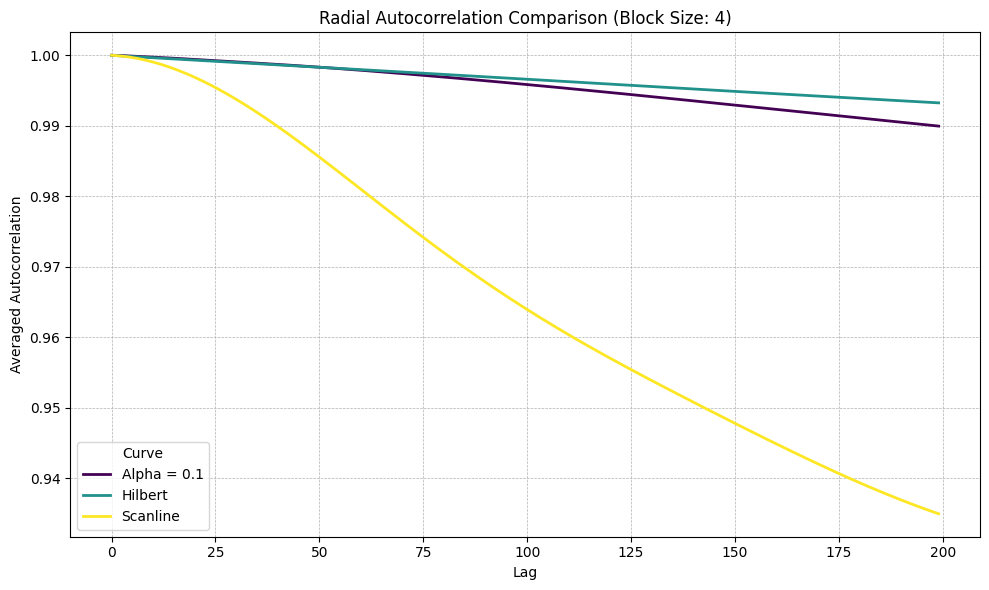

In [125]:
plt.figure(figsize=(10, 6), dpi=100)
cmap = plt.get_cmap('viridis')
id = np.linspace(0, 1, 3)

print(f"Processing Data-driven with a fixed alpha value: {ALPHA}")
u_dd = calculate_method_average(
  lambda img: dd.get_image_traversal_path(img, ALPHA, BLOCK_SIZE),
  lambda path, _: calculate_radial_autocorrelation(path, LAGS),
  volumes,
  LAGS
)

print(f"Processing Hilbert")
# Hilbert
u_h = calculate_method_average(
  lambda img: get_hilbert_path(img),
  lambda path, _: calculate_radial_autocorrelation(path, LAGS),
  volumes,
  LAGS
)

print(f"Processing Scanline")
# Scanline
u_sl = calculate_method_average(
  lambda img: get_scanline_path(img),
  lambda path, _: calculate_radial_autocorrelation(path, LAGS),
  volumes,
  LAGS
)

plt.plot(range(LAGS), u_dd, linewidth=2, color=cmap(id[0]), label=f'Alpha = {ALPHA}')
plt.plot(range(LAGS), u_h, linewidth=2, color=cmap(id[1]), label='Hilbert')
plt.plot(range(LAGS), u_sl, linewidth=2, color=cmap(id[2]), label='Scanline')

plt.title(f'Radial Autocorrelation Comparison (Block Size: {BLOCK_SIZE})')
plt.xlabel('Lag')
plt.ylabel('Averaged Autocorrelation')
plt.legend(title="Curve")
plt.grid(True, which='major', linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.plot()


### Execution-time

In [126]:
SEED = np.random.default_rng(seed=42)

In [127]:
from dataclasses import dataclass

@dataclass
class PerformanceMetrics:
  cpp_total_ms: float = 0.0
  cpp_core_ms: float = 0.0
  pybind_overhead_ms: float = 0.0
  python_overhead_ms: float = 0.0

In [128]:
def get_single_image_avg_execution_time(img, runs):
  total_execution_time = PerformanceMetrics()
  avg_execution_time = PerformanceMetrics()
  total_python_time_ms = 0
  
  for _ in range(runs):
    t0 = time.perf_counter()
    _, stats = dd.get_image_traversal_path_benchmarked(img, 0.1, 4)
    t1 = time.perf_counter()

    total_python_time_ms += (t1 - t0) * 1000.0

    total_execution_time.cpp_total_ms += stats.total_cpp_time_ms
    total_execution_time.cpp_core_ms += stats.core_algo_time_ms


  avg_execution_time.python_overhead_ms = (total_python_time_ms  - total_execution_time.cpp_total_ms) / runs
  avg_execution_time.pybind_overhead_ms = (total_execution_time.cpp_total_ms  - total_execution_time.cpp_core_ms) / runs
  avg_execution_time.cpp_core_ms = total_execution_time.cpp_core_ms / runs
  avg_execution_time.cpp_total_ms = total_execution_time.cpp_total_ms / runs

  return avg_execution_time

In [129]:
def get_execution_times_single_image(images, runs):
  avg_execution_times = []
  steps = []
  for img in images:
    H, W = img.shape[:2]

    avg_execution_time = get_single_image_avg_execution_time(img, runs)

    avg_execution_times.append(avg_execution_time)
    steps.append(H * W)

  return avg_execution_times, steps

In [130]:
def plot_execution_times_single_image(images, runs):
  metrics_list, area_values = get_execution_times_single_image(images, runs)
  
  cpp_core   = np.array([m.cpp_core_ms for m in metrics_list])
  pybind_ov  = np.array([m.pybind_overhead_ms for m in metrics_list])
  python_ov  = np.array([m.python_overhead_ms for m in metrics_list])

  cmap = plt.get_cmap('viridis')
  id = np.linspace(0, 1, 3)

  plt.figure(figsize=(10, 6))

  plt.plot(area_values, cpp_core,  marker='o', label='C++ core algorithm', color=cmap(id[0]))
  plt.plot(area_values, pybind_ov, marker='o', label='Pybind interface overhead', color=cmap(id[1]))
  plt.plot(area_values, python_ov, marker='o', label='Python overhead', color=cmap(id[2]))

  plt.title(f'Algorithm Scaling')
  plt.ylabel('Time (ms)')

  plt.xlabel('Image Pixels (H * W)')
  plt.legend(loc='upper left', frameon=True)
  plt.grid(True, which='major', linestyle='--', linewidth=0.5)
  
  # Format X-axis to standard numbers (not scientific notation 1e6)
  plt.ticklabel_format(style='plain', axis='x') 
  
  plt.tight_layout()
  plt.show()

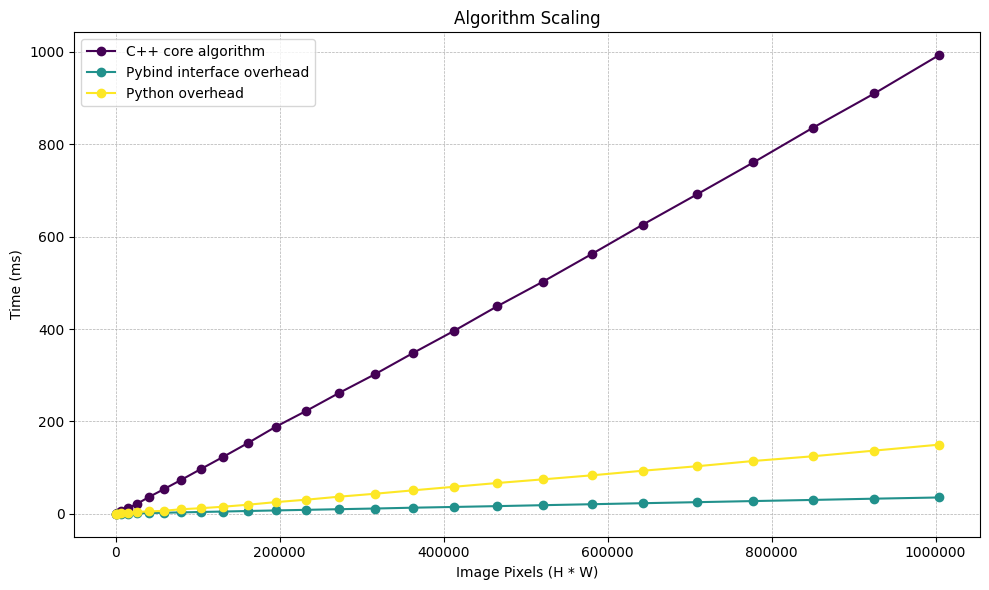

In [131]:

image_sizes = [SEED.random((x * 2, x * 2)) for x in range(1, 520, 20)]

# average after runs iteration
runs = 20
plot_execution_times_single_image(image_sizes, runs=runs)

In [132]:
def plot_execution_times_single_image_one_channel_vs_three_channels(volume, runs):
  volume_three = [SEED.random((img.shape[0], img.shape[1], 3)) for img in volume]
  
  metrics_list_three_channels, area_values = get_execution_times_single_image(volume_three, runs)
  metrics_list_single_channel, area_values = get_execution_times_single_image(volume, runs)
  
  cpp_total_single   = np.array([m.cpp_total_ms for m in metrics_list_single_channel])
  python_ov_single   = np.array([m.python_overhead_ms for m in metrics_list_single_channel])
  total_python_time_ms_single = cpp_total_single + python_ov_single

  cpp_total_three   = np.array([m.cpp_total_ms for m in metrics_list_three_channels])
  python_ov_three   = np.array([m.python_overhead_ms for m in metrics_list_three_channels])
  total_python_time_ms_three = cpp_total_three + python_ov_three

  cmap = plt.get_cmap('viridis')
  id = np.linspace(0, 1, 2)

  plt.figure(figsize=(10, 6))

  plt.plot(area_values, total_python_time_ms_single, marker='o', label='Single channel image', color=cmap(id[0]))
  plt.plot(area_values, total_python_time_ms_three,   marker='o', label='Three channel image', color=cmap(id[1]))

  plt.title(f'Image Channels Comparison')
  plt.ylabel('Time (ms)')

  plt.xlabel('Image Pixels (H * W)')
  plt.legend(loc='upper left', frameon=True)
  plt.grid(True, which='major', linestyle='--', linewidth=0.5)
  
  # Format X-axis to standard numbers (not scientific notation 1e6)
  #plt.ticklabel_format(style='plain', axis='x') 
  
  plt.tight_layout()
  plt.show()


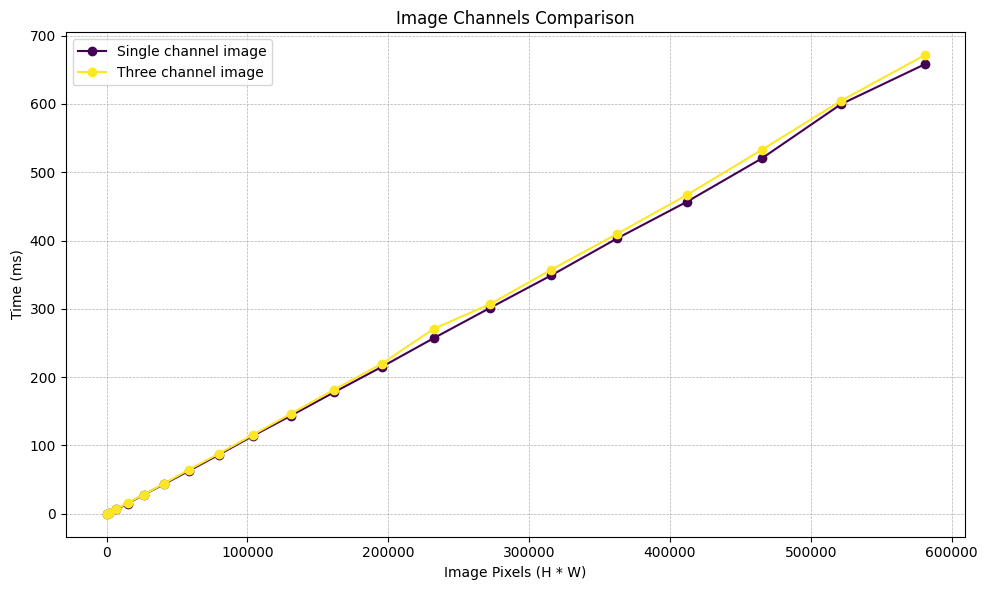

In [133]:
volume = [SEED.random((x * 2, x * 2)) for x in range(1, 400, 20)]

# average after runs iteration
runs = 20

plot_execution_times_single_image_one_channel_vs_three_channels(volume, runs=runs)

In [134]:
def get_execution_times_multiple_images(volume, runs, align_strategy = "None"):
  total_execution_time = PerformanceMetrics()
  avg_execution_time = PerformanceMetrics()
  total_python_time_ms = 0
  for _ in range(runs):
    t0 = time.perf_counter()
    _, stats = dd.get_multiple_images_traversal_path_benchmarked(volume, 0.1, 4, align_strategy)
    t1 = time.perf_counter()

    total_python_time_ms += (t1 - t0) * 1000.0

    total_execution_time.cpp_total_ms += stats.total_cpp_time_ms
    total_execution_time.cpp_core_ms += stats.core_algo_time_ms


  avg_execution_time.python_overhead_ms = (total_python_time_ms  - total_execution_time.cpp_total_ms) / runs
  avg_execution_time.pybind_overhead_ms = (total_execution_time.cpp_total_ms  - total_execution_time.cpp_core_ms) / runs
  avg_execution_time.cpp_core_ms = total_execution_time.cpp_core_ms / runs
  avg_execution_time.cpp_total_ms = total_execution_time.cpp_total_ms / runs  

  return avg_execution_time

In [135]:
"""
Compare using single vs multiple function
Variates the number of frames with array steps
Fix sized image of size H, W;
Average results after runs iterations
"""
def get_multiple_vs_single_compare_times(steps, H, W, runs):
  avg_execution_times_multiples = []
  avg_execution_times_singles = []

  for frames_cnt in steps:
    volume = np.array([SEED.random((H, W)) for _ in range(frames_cnt)])

    avg_execution_times_multiple = get_execution_times_multiple_images(volume, runs)

    all_frames_execution_times_single, _ = get_execution_times_single_image(volume, runs)
    avg_execution_times_single = PerformanceMetrics()

    # Total average is the sum of averages
    avg_execution_times_single.python_overhead_ms = np.sum([x.python_overhead_ms for x in all_frames_execution_times_single])
    avg_execution_times_single.pybind_overhead_ms = np.sum([x.pybind_overhead_ms for x in all_frames_execution_times_single])
    avg_execution_times_single.cpp_core_ms = np.sum([x.cpp_core_ms for x in all_frames_execution_times_single])
    avg_execution_times_single.cpp_total_ms = np.sum([x.cpp_total_ms for x in all_frames_execution_times_single])

    # Append results
    avg_execution_times_multiples.append(avg_execution_times_multiple)
    avg_execution_times_singles.append(avg_execution_times_single)
    

  return avg_execution_times_multiples, avg_execution_times_singles

In [136]:
def plot_execution_times_multiple_vs_single(steps, H, W, runs):
  multiple_metrics_list, single_metrics_lits = get_multiple_vs_single_compare_times(steps, H, W, runs)

  cpp_total_multiples   = np.array([m.cpp_total_ms for m in multiple_metrics_list])
  python_ov_multiples   = np.array([m.python_overhead_ms for m in multiple_metrics_list])
  total_python_time_ms_multiples = cpp_total_multiples + python_ov_multiples

  cpp_total_singles   = np.array([m.cpp_total_ms for m in single_metrics_lits])
  python_ov_singles   = np.array([m.python_overhead_ms for m in single_metrics_lits])
  total_python_time_ms_singles = cpp_total_singles + python_ov_singles

  cmap = plt.get_cmap('viridis')
  id = np.linspace(0, 1, 2)

  plt.figure(figsize=(10, 6))

  plt.plot(steps, total_python_time_ms_multiples, marker='o', label='Bulk', color=cmap(id[0]))
  plt.plot(steps, total_python_time_ms_singles,   marker='o', label='Sequential', color=cmap(id[1]))

  plt.title(f'Execution Comparision for Bulk and Sequential Input')
  plt.ylabel('Time (ms)')

  plt.xlabel('Number of Frames')
  plt.legend(loc='upper left', frameon=True)
  plt.grid(True, which='major', linestyle='--', linewidth=0.5)
  
  # Format X-axis to standard numbers (not scientific notation 1e6)
  #plt.ticklabel_format(style='plain', axis='x') 
  
  plt.tight_layout()
  plt.show()

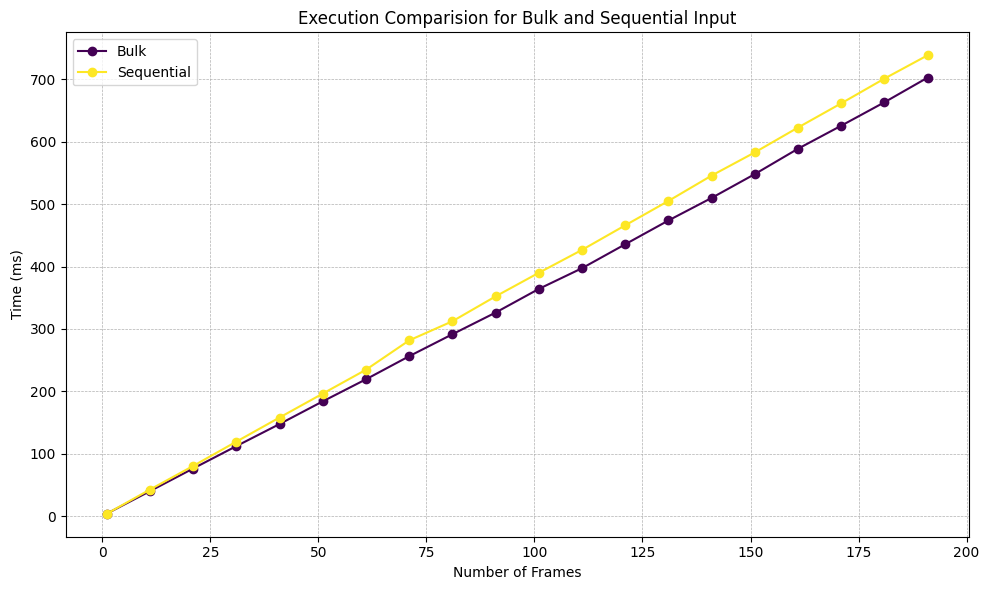

In [137]:
# Iterate over animations / volumes with frames[i] number of frames
frames = range(1, 200, 10)

# image dimension per frame
H, W = 64, 64

# average result after runs iterations
runs = 20

plot_execution_times_multiple_vs_single(frames, H, W, runs)

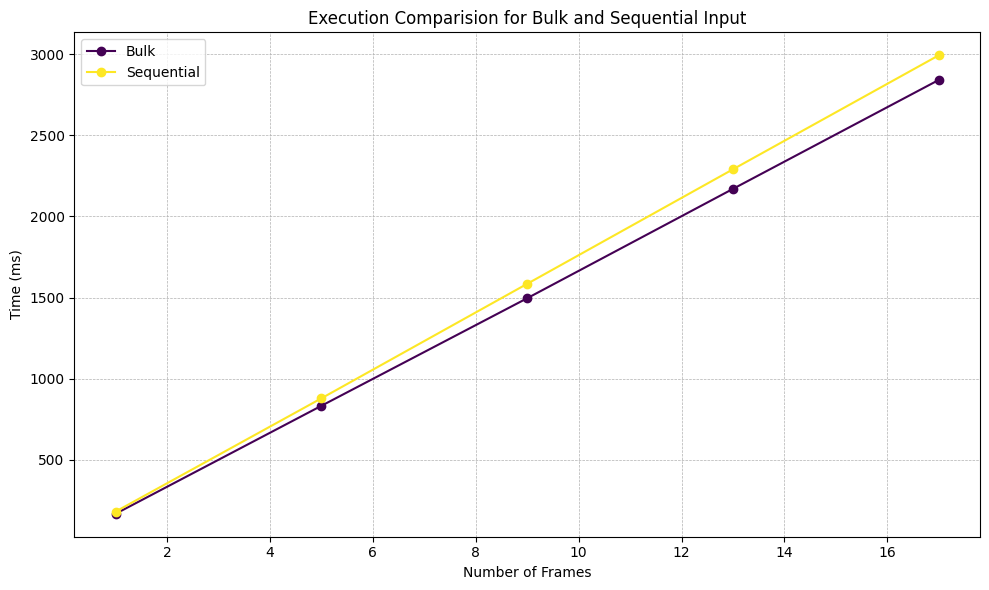

In [138]:
# Iterate over animations / volumes with frames[i] number of frames
frames = range(1, 20, 4)

# image dimension per frame
H, W = 400, 400

# average result after runs iterations
runs = 20

plot_execution_times_multiple_vs_single(frames, H, W, runs)

In [139]:
def get_execution_times_multiple_images_multiple_volumes(volumes, runs, align_strategy = "None"):
  avg_execution_times = []
  steps = []
  for volume in volumes:
    avg_execution_times.append(get_execution_times_multiple_images(volume, runs, align_strategy))
    steps.append(volume.shape[1] * volume.shape[2])
  
  return avg_execution_times, steps

In [140]:
"""
Compare total time execution between pixel alignment techniques: None, L1-norm and L2-norm

As L1 norm is expeceted to be a quadratic algorithm per frame O((H * W)^2), we will test it moderatly

We fix the number of frames here, and variate the image sizes per volume
"""
def plot_multiple_images_align_strategy_comparison(total_frames, image_sizes_none, image_sizes_l1, image_sizes_l2, runs):
  volumes_none = [SEED.random((total_frames, H, W)) for H, W in image_sizes_none]
  volumes_l1   = [SEED.random((total_frames, H, W)) for H, W in image_sizes_l1]
  volumes_l2   = [SEED.random((total_frames, H, W)) for H, W in image_sizes_l2]

  metrics_none, sizes_none = get_execution_times_multiple_images_multiple_volumes(volumes_none, runs, "None")
  metrics_l1, sizes_l1 = get_execution_times_multiple_images_multiple_volumes(volumes_l1, runs, "L1-norm")
  metrics_l2, sizes_l2 = get_execution_times_multiple_images_multiple_volumes(volumes_l2, runs, "L2-norm")

  # none total_execution time
  cpp_total_none   = np.array([m.cpp_total_ms for m in metrics_none])
  python_ov_none   = np.array([m.python_overhead_ms for m in metrics_none])
  total_python_time_ms_none = cpp_total_none + python_ov_none

  # L1 total_execution time
  cpp_total_l1   = np.array([m.cpp_total_ms for m in metrics_l1])
  python_ov_l1   = np.array([m.python_overhead_ms for m in metrics_l1])
  total_python_time_ms_l1 = cpp_total_l1 + python_ov_l1


  # L2 total_execution time
  cpp_total_l2   = np.array([m.cpp_total_ms for m in metrics_l2])
  python_ov_l2   = np.array([m.python_overhead_ms for m in metrics_l2])
  total_python_time_ms_l2 = cpp_total_l2 + python_ov_l2

  cmap = plt.get_cmap('viridis')
  id = np.linspace(0, 1, 3)

  plt.figure(figsize=(10, 6))

  plt.plot(sizes_none, total_python_time_ms_none, marker='o', label='None', color=cmap(id[0]))
  plt.plot(sizes_l1, total_python_time_ms_l1,   marker='o', label='L1-norm', color=cmap(id[1]))
  plt.plot(sizes_l2, total_python_time_ms_l2, marker='o', label='L2-norm', color=cmap(id[2]))

  plt.title(f'Curve Aligment Strategy Spatial Scaling')
  plt.ylabel('Time (ms)')

  plt.xlabel('Image Pixels per Volume (H * W)')
  plt.legend(loc='upper right', frameon=True)
  plt.grid(True, which='major', linestyle='--', linewidth=0.5)
  
  # Format X-axis to standard numbers (not scientific notation 1e6)
  #plt.ticklabel_format(style='plain', axis='x') 
  
  plt.tight_layout()
  plt.show()


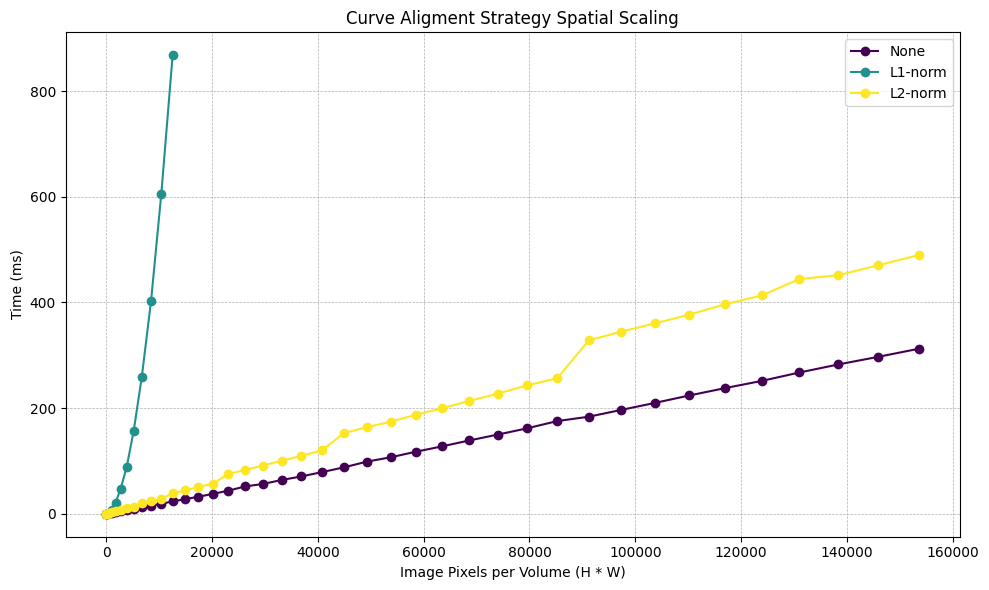

In [141]:
image_sizes = [(x * 2, x * 2) for x in range(1, 200, 5)]

image_sizes_none = image_sizes
image_sizes_l1   = image_sizes[:12]
image_sizes_l2   = image_sizes

# runs x number of times and calculate the mean to plot in the y axis
runs = 20

# each animations has x frames fixed, variates image size
frames_per_volume = 2
plot_multiple_images_align_strategy_comparison(frames_per_volume, image_sizes_none, image_sizes_l1, image_sizes_l2, runs)


In [142]:
"""
Compare total time execution between pixel alignment techniques: None, L1-norm and L2-norm

This time, we fixates the size and increase the number of frames.
"""
def plot_multiple_images_align_strategy_comparison_fixed_image_sizes(step_frames, H, W, runs):
  volumes_none = [SEED.random((f, H, W)) for f in step_frames]
  volumes_l1   = [SEED.random((f, H, W)) for f in step_frames]
  volumes_l2   = [SEED.random((f, H, W)) for f in step_frames]

  metrics_none, _ = get_execution_times_multiple_images_multiple_volumes(volumes_none, runs, "None")
  metrics_l1, _ = get_execution_times_multiple_images_multiple_volumes(volumes_l1, runs, "L1-norm")
  metrics_l2, _ = get_execution_times_multiple_images_multiple_volumes(volumes_l2, runs, "L2-norm")

  # none total_execution time
  cpp_total_none   = np.array([m.cpp_total_ms for m in metrics_none])
  python_ov_none   = np.array([m.python_overhead_ms for m in metrics_none])
  total_python_time_ms_none = cpp_total_none + python_ov_none

  # L1 total_execution time
  cpp_total_l1   = np.array([m.cpp_total_ms for m in metrics_l1])
  python_ov_l1   = np.array([m.python_overhead_ms for m in metrics_l1])
  total_python_time_ms_l1 = cpp_total_l1 + python_ov_l1


  # L2 total_execution time
  cpp_total_l2   = np.array([m.cpp_total_ms for m in metrics_l2])
  python_ov_l2   = np.array([m.python_overhead_ms for m in metrics_l2])
  total_python_time_ms_l2 = cpp_total_l2 + python_ov_l2

  cmap = plt.get_cmap('viridis')
  id = np.linspace(0, 1, 3)

  plt.figure(figsize=(10, 6))

  plt.plot(step_frames, total_python_time_ms_none, marker='o', label='None', color=cmap(id[0]))
  plt.plot(step_frames, total_python_time_ms_l1,   marker='o', label='L1-norm', color=cmap(id[1]))
  plt.plot(step_frames, total_python_time_ms_l2, marker='o', label='L2-norm', color=cmap(id[2]))

  plt.title(f'Curve Aligment Strategy Temporal Scaling')
  plt.ylabel('Time (ms)')

  plt.xlabel('Number of Frames')
  plt.legend(loc='upper right', frameon=True)
  plt.grid(True, which='major', linestyle='--', linewidth=0.5)
  
  # Format X-axis to standard numbers (not scientific notation 1e6)
  #plt.ticklabel_format(style='plain', axis='x') 
  
  plt.tight_layout()
  plt.show()


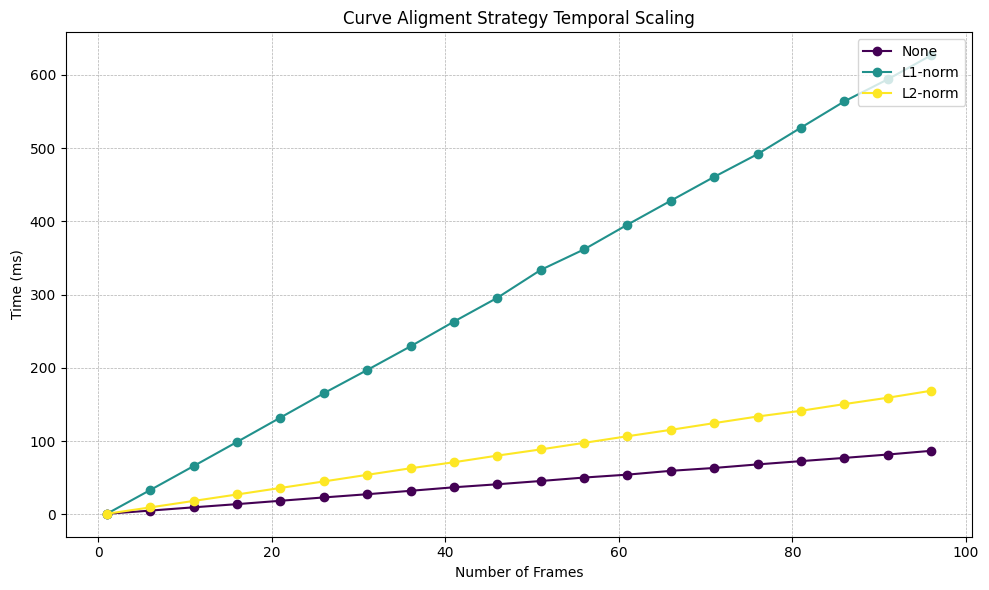

In [143]:
step_frames = range(1, 100, 5)

# Fixed per frame image size
H, W = 32, 32

runs = 20

plot_multiple_images_align_strategy_comparison_fixed_image_sizes(step_frames, H, W, runs)